In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import gc
import time
import joblib
import sys
from contextlib import contextmanager
from datetime import datetime
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay    
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, balanced_accuracy_score, roc_auc_score, roc_curve,make_scorer, accuracy_score, f1_score, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier

import lightgbm as lgb

import mlflow
import mlflow.sklearn
import lime
import lime.lime_tabular

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
df = pd.read_csv('water_potability.csv')


In [3]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [4]:
df.shape

(3276, 10)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

<Axes: >

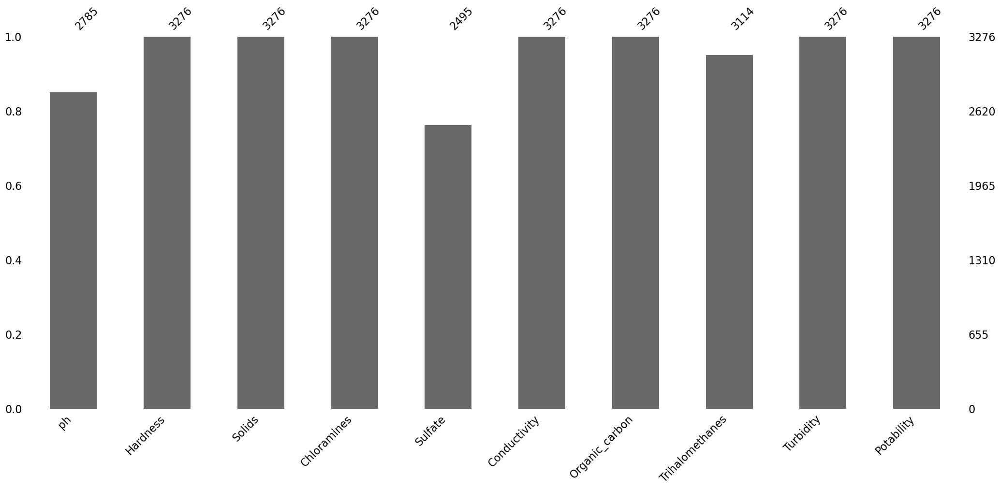

In [7]:
msno.bar(df)

**Premières observations :**

* Le dataframe contient 10 colonnes et 3276 lignes.  
* 3 colonnes contiennent des valeurs manquantes.
* La colonne 'Potability' indique si l'eau est potable ou non (1 = Potable / 0 = non potable).

**Définition des variables :** 

* 1. Valeur pH :
Le pH est un paramètre important dans l’évaluation de l’équilibre acido-basique de l’eau. C'est également l'indicateur de l'état acide ou alcalin de l'eau. **L'OMS a recommandé une limite maximale admissible de pH de 6,5 à 8,5. Les plages d'investigation actuelles étaient comprises entre 6,52 et 6,83**, ce qui correspond aux normes de l'OMS.

* 2. Dureté :
La dureté est principalement causée par les sels de calcium et de magnésium. Ces sels sont dissous à partir de dépôts géologiques à travers lesquels passe l’eau. La durée pendant laquelle l’eau est en contact avec un matériau produisant de la dureté aide à déterminer la quantité de dureté présente dans l’eau brute. 

* 3. Solides (Total des solides dissous - TDS) :
L'eau a la capacité de dissoudre une large gamme de minéraux ou de sels inorganiques et organiques tels que le potassium, le calcium, le sodium, les bicarbonates, les chlorures, le magnésium, les sulfates, etc. **C'est le paramètre important pour l'utilisation de l'eau. L'eau avec une valeur TDS élevée indique que l'eau est hautement minéralisée. La limite souhaitable pour le TDS est de 500 mg/l et la limite maximale est de 1 000 mg/l**, prescrite pour la consommation.

* 4. Chloramines :
Le chlore et la chloramine sont les principaux désinfectants utilisés dans les réseaux publics d'eau. Les chloramines se forment le plus souvent lorsque de l'ammoniac est ajouté au chlore pour traiter l'eau potable. **Des niveaux de chlore allant jusqu'à 4 milligrammes par litre (mg/L ou 4 parties par million (ppm)) sont considérés comme sûrs dans l'eau potable.**

* 5. Sulfate :
Les sulfates sont des substances naturelles présentes dans les minéraux, le sol et les roches. Ils sont présents dans l’air ambiant, les eaux souterraines, les plantes et les aliments. La principale utilisation commerciale du sulfate se situe dans l’industrie chimique. **La concentration de sulfate dans l'eau de mer est d'environ 2 700 milligrammes par litre (mg/L). Elle varie de 3 à 30 mg/L dans la plupart des réserves d'eau douce, bien que des concentrations beaucoup plus élevées (1 000 mg/L)** soient trouvées dans certaines zones géographiques.

* 6. Conductivité :
L’eau pure n’est pas un bon conducteur de courant électrique, mais plutôt un bon isolant. L'augmentation de la concentration en ions améliore la conductivité électrique de l'eau. Généralement, la quantité de solides dissous dans l’eau détermine la conductivité électrique. La conductivité électrique (CE) mesure en fait le processus ionique d'une solution qui lui permet de transmettre le courant. **Selon les normes de l'OMS, la valeur EC ne doit pas dépasser 400 μS/cm.**

* 7. Carbone_organique :
Le carbone organique total (COT) dans les eaux de source provient de la matière organique naturelle (MON) en décomposition ainsi que de sources synthétiques. **Le COT est une mesure de la quantité totale de carbone contenue dans les composés organiques de l'eau pure. Selon l'US EPA < 2 mg/L de COT dans l'eau traitée/potable, et < 4 mg/L dans l'eau de source utilisée pour le traitement.**

* 8. Trihalométhanes :
Les THM sont des produits chimiques qui peuvent être présents dans l'eau traitée au chlore. La concentration de THM dans l'eau potable varie en fonction du niveau de matière organique présente dans l'eau, de la quantité de chlore requise pour traiter l'eau et de la température de l'eau traitée. Des niveaux de THM allant jusqu'à 80 ppm sont considérés comme sans danger dans l'eau potable.

* 9. Turbidité :
La turbidité de l'eau dépend de la quantité de matières solides présentes à l'état en suspension. Il s'agit d'une mesure des propriétés électroluminescentes de l'eau et le test est utilisé pour indiquer la qualité des rejets de déchets en ce qui concerne la matière colloïdale. La valeur moyenne de turbidité obtenue pour le Campus Wondo Genet (0,98 NTU) est inférieure à la valeur recommandée par l'OMS de 5,00 NTU.

* 10. Potabilité :
Indique si l'eau est propre à la consommation humaine, 1 signifiant potable et 0 signifiant non potable.


In [8]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


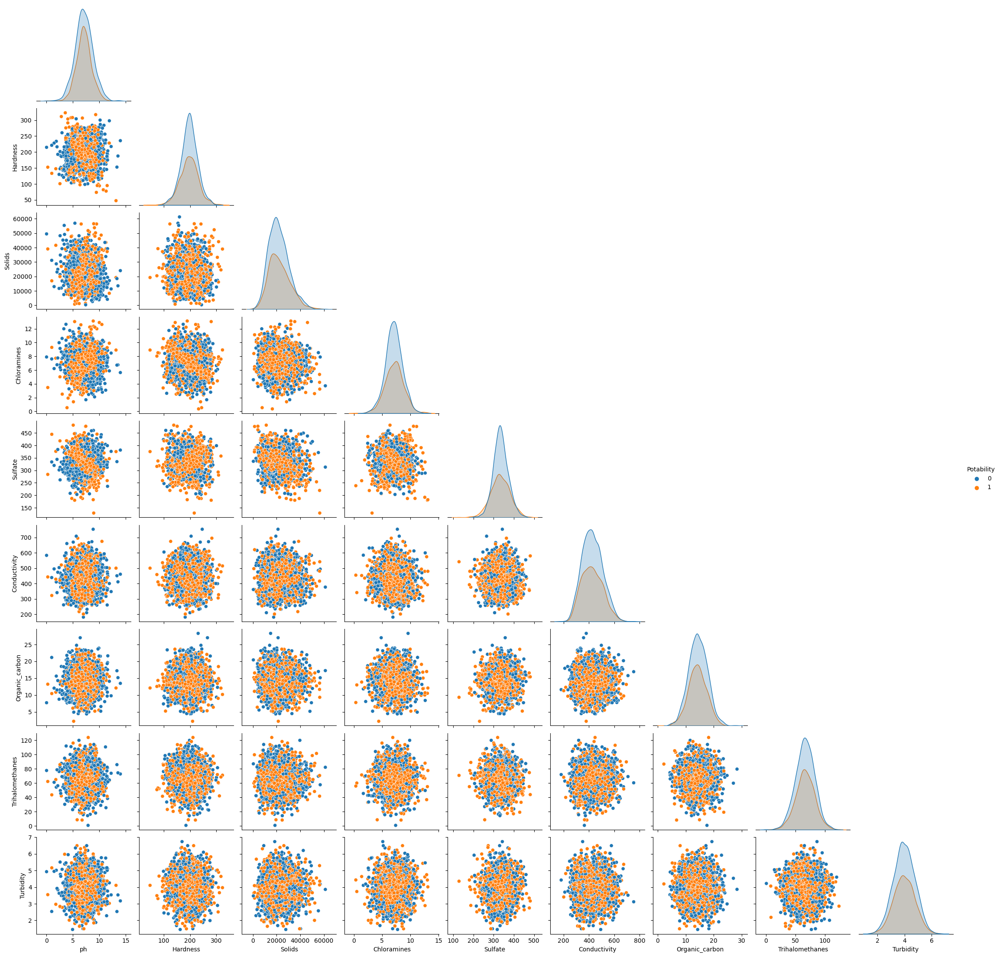

In [9]:
sns.pairplot(df,hue='Potability',corner=True)

Face à l'incompréhension des données, nous avons continué nos recherches sur internet et trouvé de nouvelles informations qui nous indique une erreur sur les mesures annoncées dans le premier descriptif:  
1. ph: pH of 1. water (0 to 14).
2. Hardness: Capacity of water to precipitate soap in mg/L.
3. Solids: Total dissolved solids in ppm.
4. Chloramines: Amount of Chloramines in ppm.
5. Sulfate: Amount of Sulfates dissolved in mg/L.
6. Conductivity: Electrical conductivity of water in μS/cm.
7. Organic_carbon: Amount of organic carbon in ppm.
8. Trihalomethanes: Amount of Trihalomethanes in μg/L.
9. Turbidity: Measure of light emiting property of water in NTU.
10. Potability: Indicates if water is safe for human consumption. Potable -1 and Not potable -0  

La colonne Solids n'est pas à la bonne échelle.


In [10]:
#df['Solids'] = df['Solids'] / 1000

df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [11]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

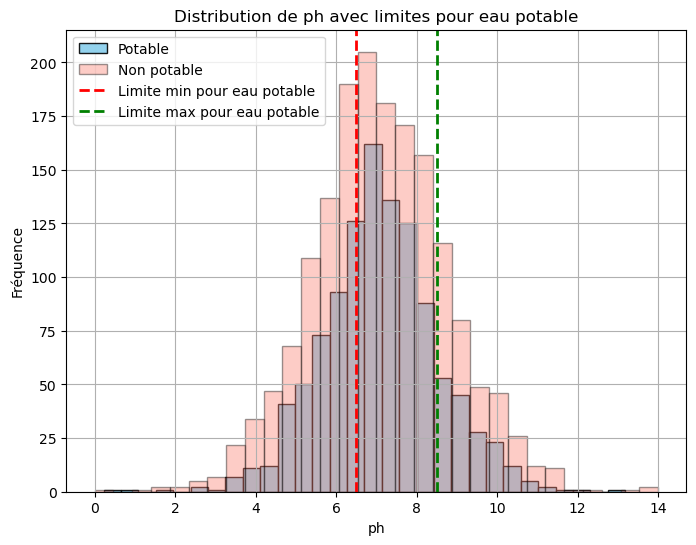

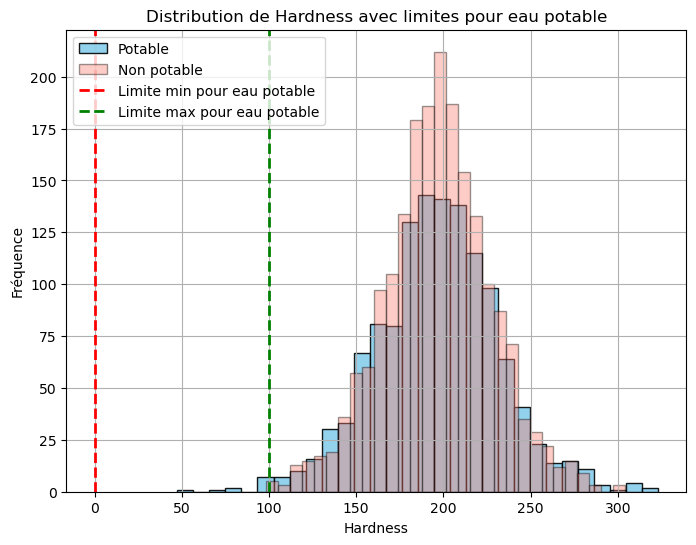

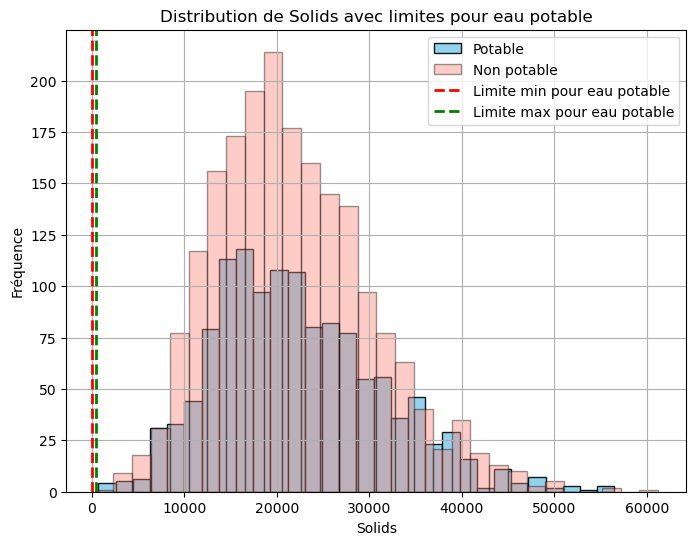

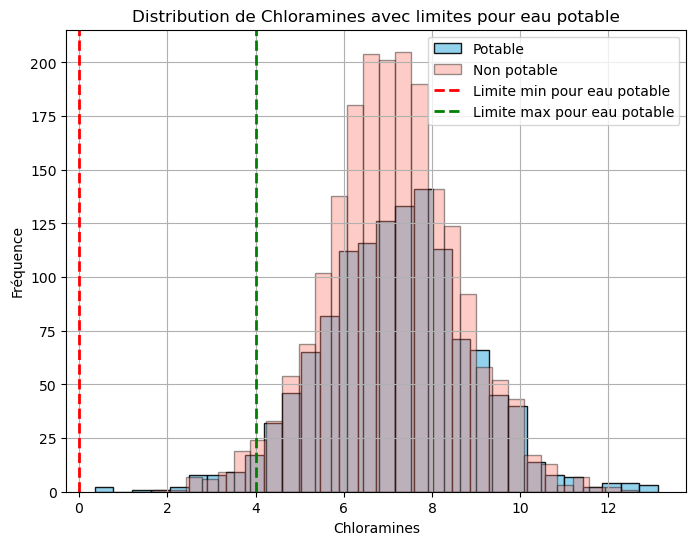

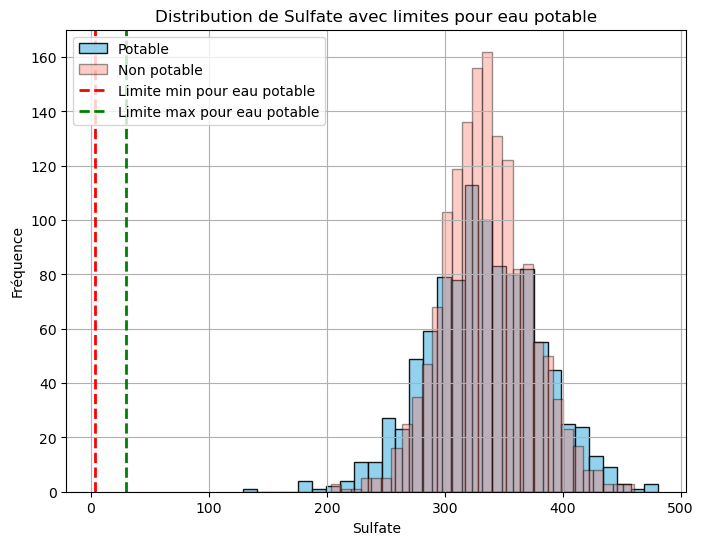

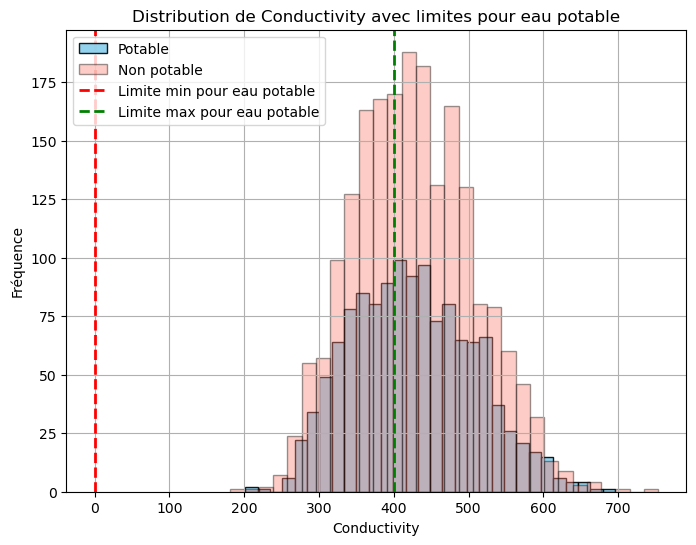

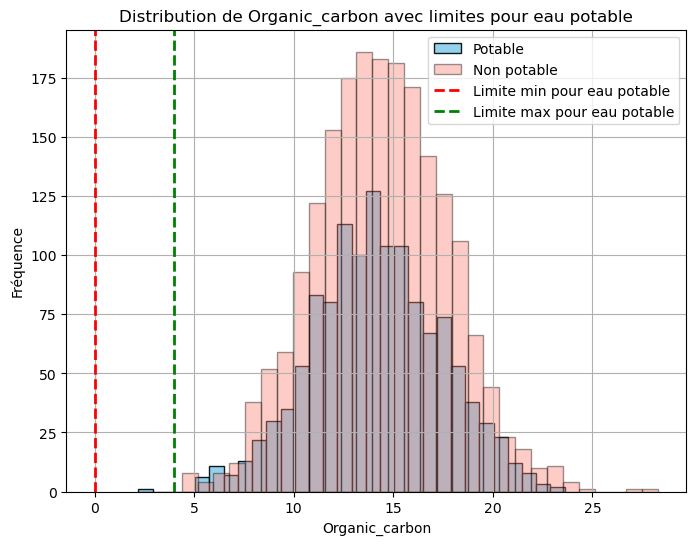

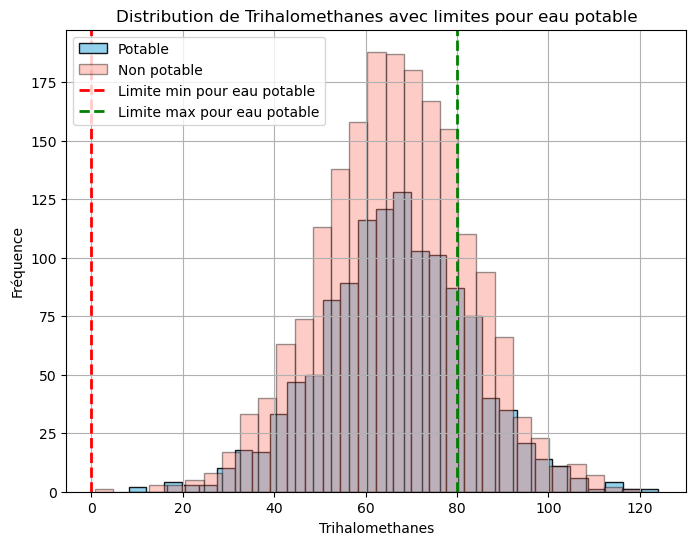

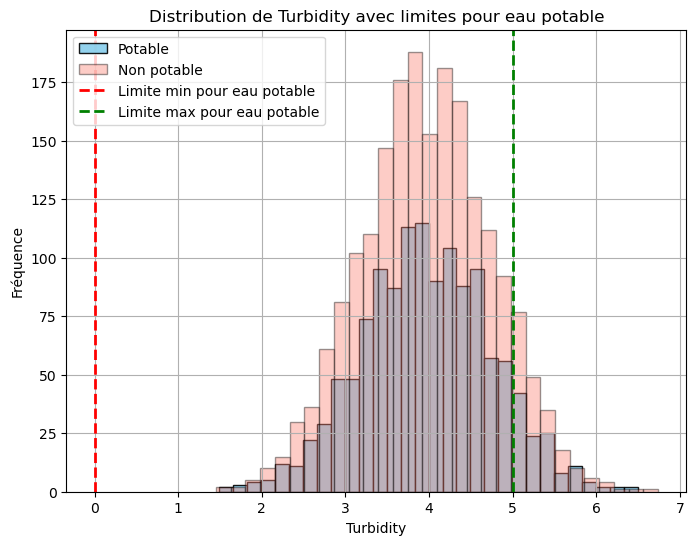

In [12]:
water_quality_standards = {
    'ph': (6.5, 8.5),
    'Hardness': (0, 100),
    'Solids': (0, 500),
    'Chloramines': (0, 4),
    'Sulfate': (3, 30),
    'Conductivity': (0, 400),
    'Organic_carbon': (0, 4),
    'Trihalomethanes': (0, 80),
    'Turbidity': (0, 5)
}

for column, (min_value, max_value) in water_quality_standards.items():
    plt.figure(figsize=(8, 6))
    plt.hist(df[df['Potability'] == 1][column], bins=30, color='skyblue', edgecolor='black', alpha=0.9, label='Potable')
    plt.hist(df[df['Potability'] == 0][column], bins=30, color='salmon', edgecolor='black', alpha=0.4, label='Non potable')
    plt.axvline(x=min_value, color='red', linestyle='--', linewidth=2, label='Limite min pour eau potable')
    plt.axvline(x=max_value, color='green', linestyle='--', linewidth=2, label='Limite max pour eau potable')
    plt.title(f'Distribution de {column} avec limites pour eau potable')
    plt.xlabel(column)
    plt.ylabel('Fréquence')
    plt.legend()
    plt.grid(True)
    plt.show()


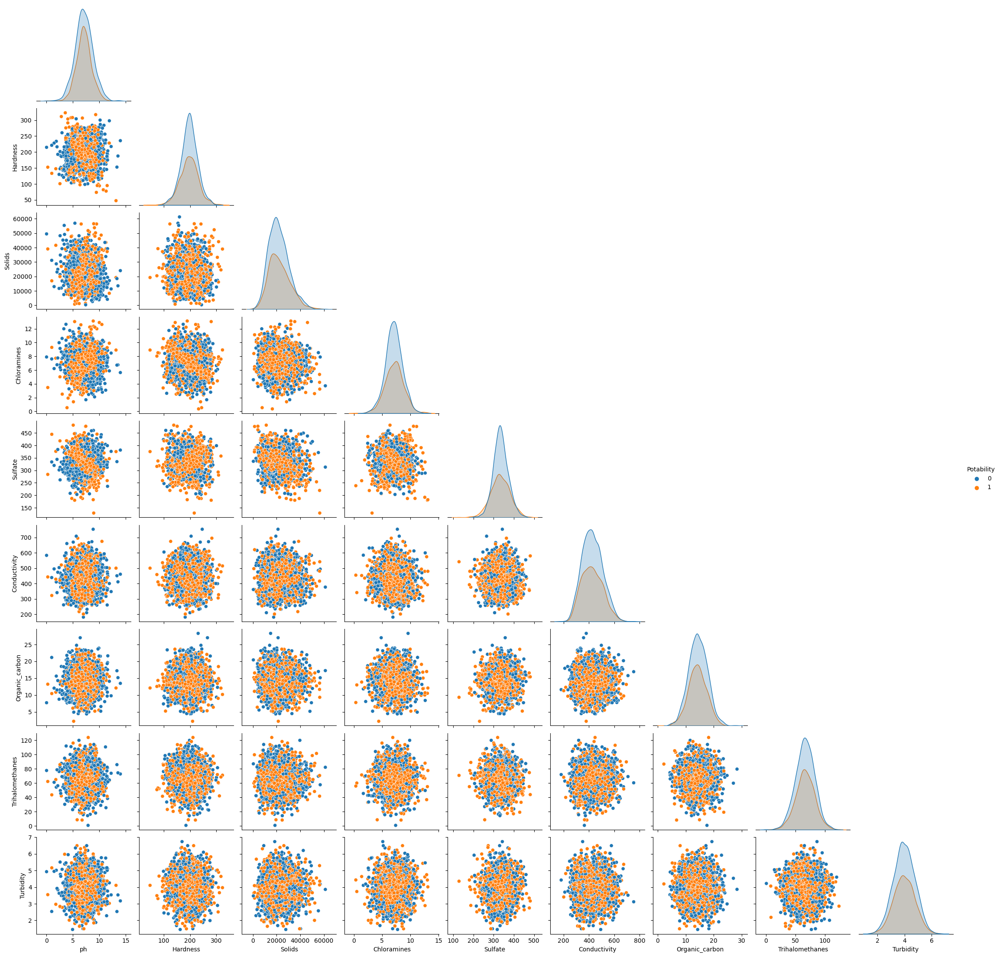

In [13]:
sns.pairplot(df,hue='Potability',corner=True)

En analysant le jeu de données, nous remarquons des anomalies de labellisation de l'eau. Il existe des normes précises et strictes pour qualifier une eau de potable. 
 

In [14]:
df_1 = df.loc[df['Potability']==1,:]
df_0 = df.loc[df['Potability']==0,:]

In [15]:
df_1.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1101.000000,1278.000000,1278.000000,1278.000000,985.000000,1278.000000,1278.000000,1223.000000,1278.000000,1278.0
mean,7.073783,195.800744,22383.991018,7.169338,332.566990,425.383800,14.160893,66.539684,3.968328,1.0
std,1.448048,35.547041,9101.010208,1.702988,47.692818,82.048446,3.263907,16.327419,0.780842,0.0
min,0.227499,47.432000,728.750830,0.352000,129.000000,201.619737,2.200000,8.175876,1.492207,1.0
25%,6.179312,174.330531,15668.985035,6.094134,300.763772,360.939023,12.033897,56.014249,3.430909,1.0
50%,7.036752,196.632907,21199.386614,7.215163,331.838167,420.712729,14.162809,66.678214,3.958576,1.0
75%,7.933068,218.003420,27973.236446,8.199261,365.941346,484.155911,16.356245,77.380975,4.509569,1.0
max,13.175402,323.124000,56488.672413,13.127000,481.030642,695.369528,23.604298,124.000000,6.494249,1.0


In [16]:
df_1 = df_1.sort_values(by='ph',ascending=False)
df_1.head(35)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
263,13.175402,47.432000,19237.949676,8.907020,375.147315,500.245952,12.083896,NaN,4.106924,1
783,11.898078,228.132673,8296.550611,9.899637,346.649750,500.169210,15.486862,63.529460,3.024968,1
3269,11.491011,94.812545,37188.826022,9.263166,258.930600,439.893618,16.172755,41.558501,4.369264,1
317,11.301794,77.459586,39227.619457,8.517986,337.501247,410.856114,14.326889,53.121260,3.309580,1
1162,11.244507,169.403655,43533.657845,5.888460,341.029600,336.446655,16.089710,59.494026,2.929953,1
805,10.905076,207.004837,16099.151896,8.186479,369.683867,575.309037,17.556880,80.749849,3.720264,1
3249,10.808157,198.596751,29614.348790,5.782418,304.622061,383.269410,14.902820,47.896406,4.362542,1
1155,10.774318,163.095106,38037.353074,7.602197,350.000236,477.723375,13.526522,NaN,3.229834,1
278,10.761898,81.710895,25999.953669,8.477394,318.427241,392.704082,12.716350,52.246972,4.661799,1
3246,10.667364,173.381945,28912.202201,7.071294,276.634391,286.063394,17.685651,55.147364,4.135569,1


Les graphiques ainsi que le dataframe ci-dessus indiquent que les données ne respectent pas les normes. 
Une eau avec un ph 13.17 ne peut pas être potable.  


In [17]:
df.loc[
    (df['ph'] >= 6.5) & (df['ph'] <= 8.5) &
    (df['Hardness'] <= 100) &
    (df['Solids'] <= 500) &
    (df['Chloramines'] <= 4) &
    (df['Sulfate'] <= 30) &
    (df['Conductivity'] <= 400) &
    (df['Organic_carbon'] <= 4) &
    (df['Trihalomethanes'] <= 80) &
    (df['Turbidity'] <= 5)
]


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability


In [18]:
df.loc[
    (df['ph'] >= 6.5) & (df['ph'] <= 8.5) &
  #(df['Hardness'] <= 100) 
   #(df['Solids'] <= 500) &
   # (df['Chloramines'] <= 4) &
    #(df['Sulfate'] <= 30) &
   # (df['Conductivity'] <= 400) &
  # (df['Organic_carbon'] <= 4) &
   (df['Trihalomethanes'] <= 80) &
 (df['Turbidity'] <= 5)
]


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
10,7.360640,165.520797,32452.614409,7.550701,326.624353,425.383419,15.586810,78.740016,3.662292,0
11,7.974522,218.693300,18767.656682,8.110385,NaN,364.098230,14.525746,76.485911,4.011718,0
12,7.119824,156.704993,18730.813653,3.606036,282.344050,347.715027,15.929536,79.500778,3.445756,0
14,7.496232,205.344982,28388.004887,5.072558,NaN,444.645352,13.228311,70.300213,4.777382,0
...,...,...,...,...,...,...,...,...,...,...
3263,6.923636,260.593154,24792.525623,5.501164,332.232177,607.773567,15.483027,51.535867,4.013339,1
3265,8.197353,203.105091,27701.794055,6.472914,328.886838,444.612724,14.250875,62.906205,3.361833,1
3266,8.372910,169.087052,14622.745494,7.547984,NaN,464.525552,11.083027,38.435151,4.906358,1
3268,6.702547,207.321086,17246.920347,7.708117,304.510230,329.266002,16.217303,28.878601,3.442983,1


In [21]:
df.loc[
    (df['ph'] >= 6.5) & (df['ph'] <= 8.5) &
   (df['Trihalomethanes'] <= 80) &
 (df['Turbidity'] <= 5),'Potability'
]= 1


In [23]:
df['Potability'].value_counts()

Potability
1    1801
0    1475
Name: count, dtype: int64

Ces données ne sont pas pertinentes mais nous allons les conserver en l'état, entraîner des modèles et analyser les performances.

In [24]:
df.loc[df['Potability']==1,:].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1624.000000,1801.000000,1801.000000,1801.000000,1373.000000,1801.000000,1801.000000,1746.000000,1801.000000,1801.0
mean,7.188661,196.722987,22180.766956,7.124787,333.206418,427.557585,14.242709,64.821444,3.920326,1.0
std,1.244598,33.579473,8708.911616,1.628090,44.700937,81.474841,3.281727,15.650200,0.749683,0.0
min,0.227499,47.432000,728.750830,0.352000,129.000000,181.483754,2.200000,0.738000,1.492207,1.0
25%,6.588970,177.055890,15823.339374,6.086599,304.732203,365.626487,12.065963,55.156360,3.418611,1.0
50%,7.213456,197.648530,21153.322827,7.157952,333.271370,423.455906,14.225917,65.180235,3.914512,1.0
75%,7.917716,217.788932,27463.654795,8.111958,362.489560,484.104784,16.535186,75.065636,4.431739,1.0
max,13.175402,323.124000,56488.672413,13.127000,481.030642,695.369528,23.604298,124.000000,6.494249,1.0


In [25]:
df.loc[df['Potability']==0,:].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1161.000000,1475.000000,1475.000000,1475.000000,1122.000000,1475.000000,1475.000000,1368.000000,1475.000000,1475.0
mean,6.929912,195.937877,21810.580222,7.119211,334.472505,424.553716,14.336572,68.406297,4.023515,0.0
std,1.973342,32.010717,8839.565055,1.526879,37.011588,80.018855,3.340546,16.611202,0.812966,0.0
min,0.000000,103.173587,320.942611,2.102691,203.444521,232.613624,4.466772,14.343161,1.450000,0.0
25%,5.584124,176.725200,15305.811298,6.190727,311.488974,366.524930,12.065749,57.392011,3.471440,0.0
50%,6.430255,196.034623,20709.279762,7.091522,332.784159,420.549219,14.213794,68.653734,4.010809,0.0
75%,8.613699,215.735995,27169.072757,8.115561,357.033648,480.161885,16.595854,80.737977,4.591567,0.0
max,14.000000,304.235912,61227.196008,12.653362,460.107069,753.342620,28.300000,120.030077,6.739000,0.0


## Imputation des valeurs manquantes

In [26]:
df.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [28]:
df.loc[df['Potability']==1,'ph']=df['ph'].fillna(df['ph'].median())
df.loc[df['Potability']==1,'Sulfate']=df['Sulfate'].fillna(df['Sulfate'].median())
df.loc[df['Potability']==1,'Trihalomethanes']=df['Trihalomethanes'].fillna(df['Trihalomethanes'].median())

In [29]:
df.loc[df['Potability']==0,'ph']=df['ph'].fillna(df['ph'].median())
df.loc[df['Potability']==0,'Sulfate']=df['Sulfate'].fillna(df['Sulfate'].median())
df.loc[df['Potability']==0,'Trihalomethanes']=df['Trihalomethanes'].fillna(df['Trihalomethanes'].median())

In [30]:
df.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

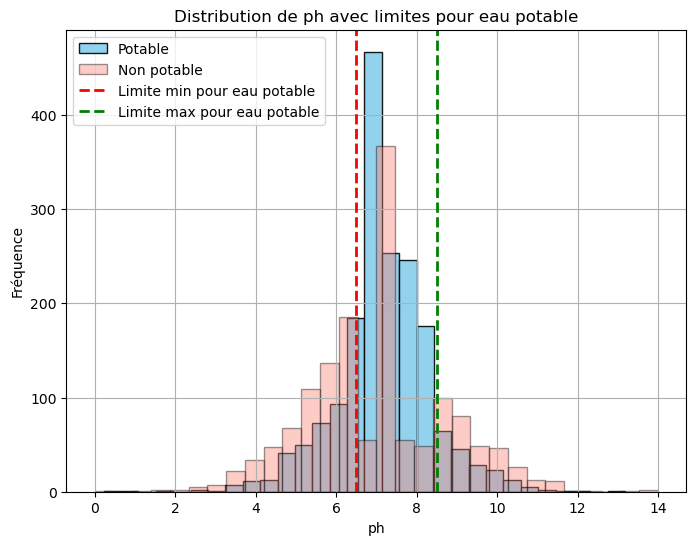

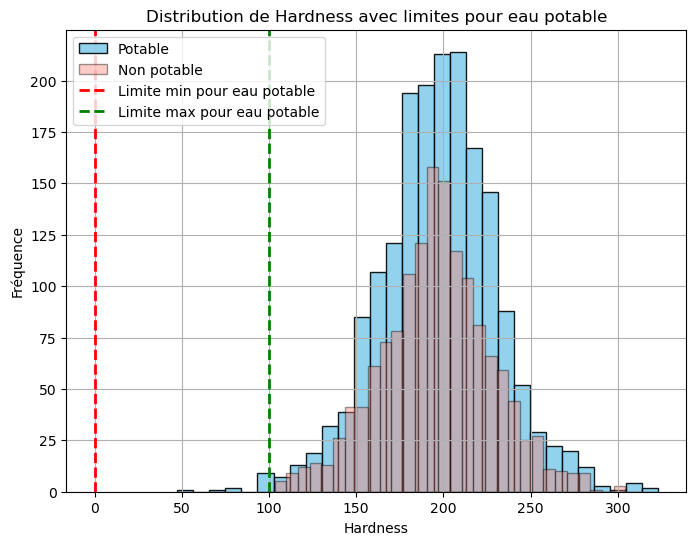

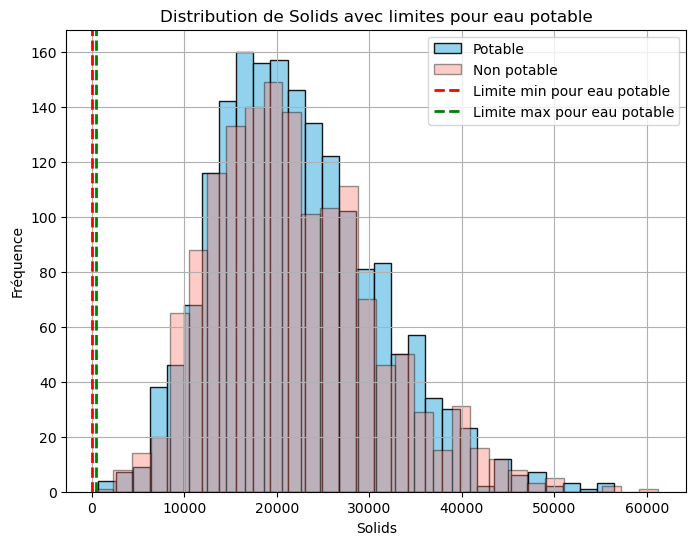

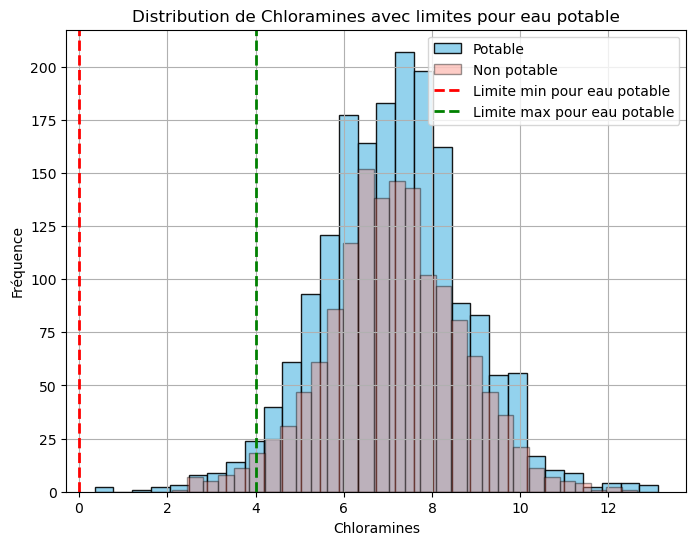

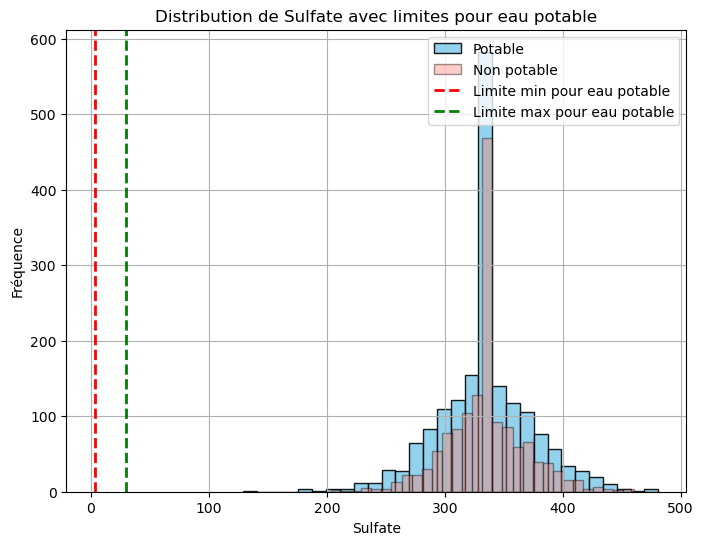

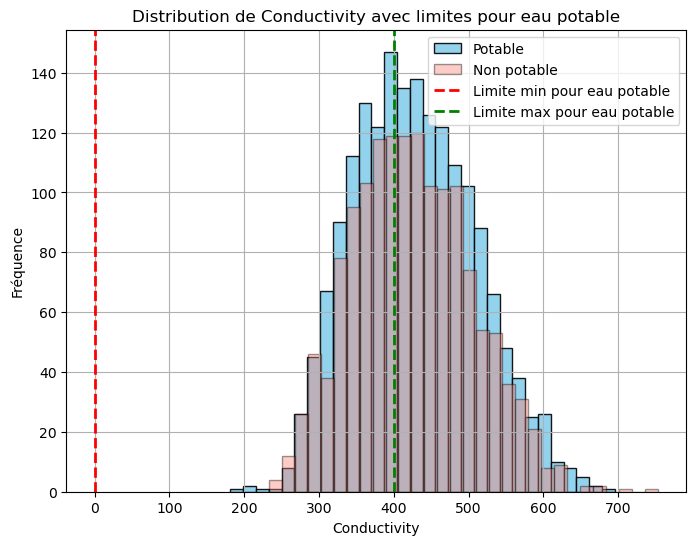

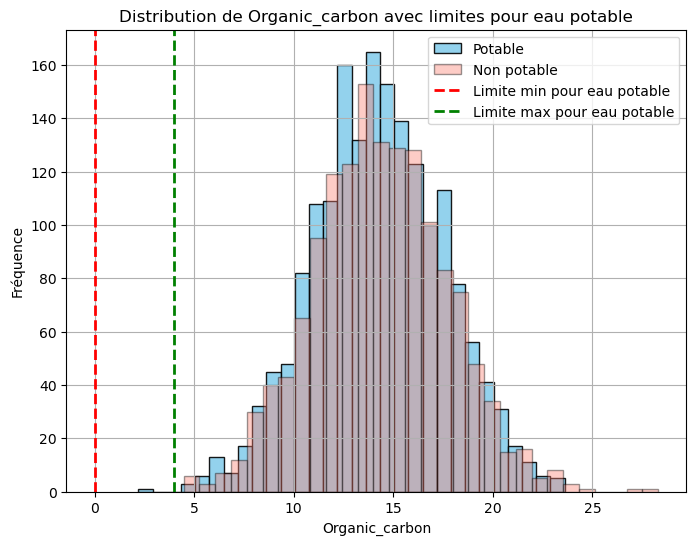

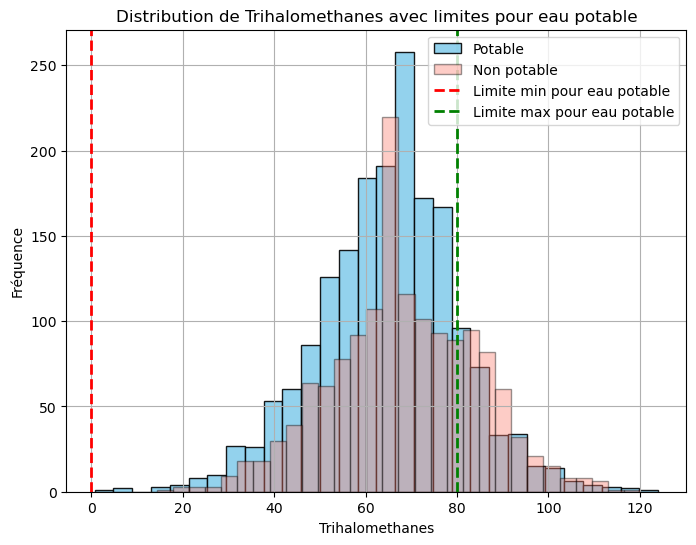

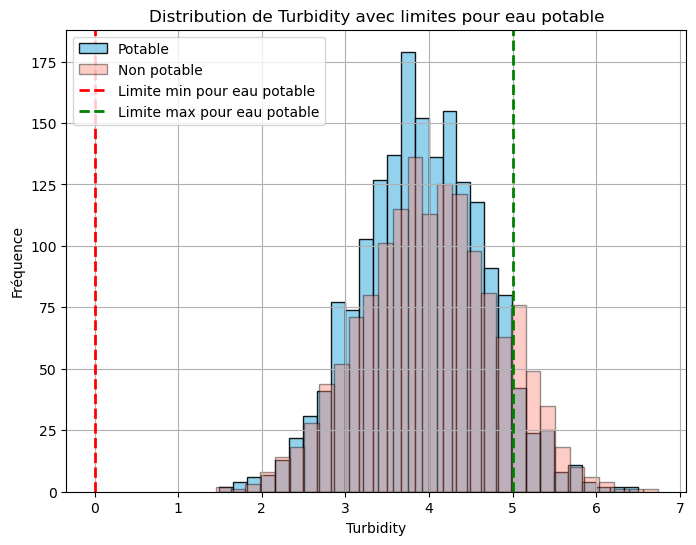

In [31]:
for column, (min_value, max_value) in water_quality_standards.items():
    plt.figure(figsize=(8, 6))
    plt.hist(df[df['Potability'] == 1][column], bins=30, color='skyblue', edgecolor='black', alpha=0.9, label='Potable')
    plt.hist(df[df['Potability'] == 0][column], bins=30, color='salmon', edgecolor='black', alpha=0.4, label='Non potable')
    plt.axvline(x=min_value, color='red', linestyle='--', linewidth=2, label='Limite min pour eau potable')
    plt.axvline(x=max_value, color='green', linestyle='--', linewidth=2, label='Limite max pour eau potable')
    plt.title(f'Distribution de {column} avec limites pour eau potable')
    plt.xlabel(column)
    plt.ylabel('Fréquence')
    plt.legend()
    plt.grid(True)
    plt.show()


In [32]:
df_new = df.copy()

In [33]:
df_new.iloc[:,:-1]

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135
1,3.716080,129.422921,18630.057858,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656
2,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821
3272,7.808856,193.553212,17329.802160,8.061362,333.073546,392.449580,19.903225,66.622485,2.798243
3273,9.419510,175.762646,33155.578218,7.350233,333.073546,432.044783,11.039070,69.845400,3.298875
3274,5.126763,230.603758,11983.869376,6.303357,333.073546,402.883113,11.168946,77.488213,4.708658


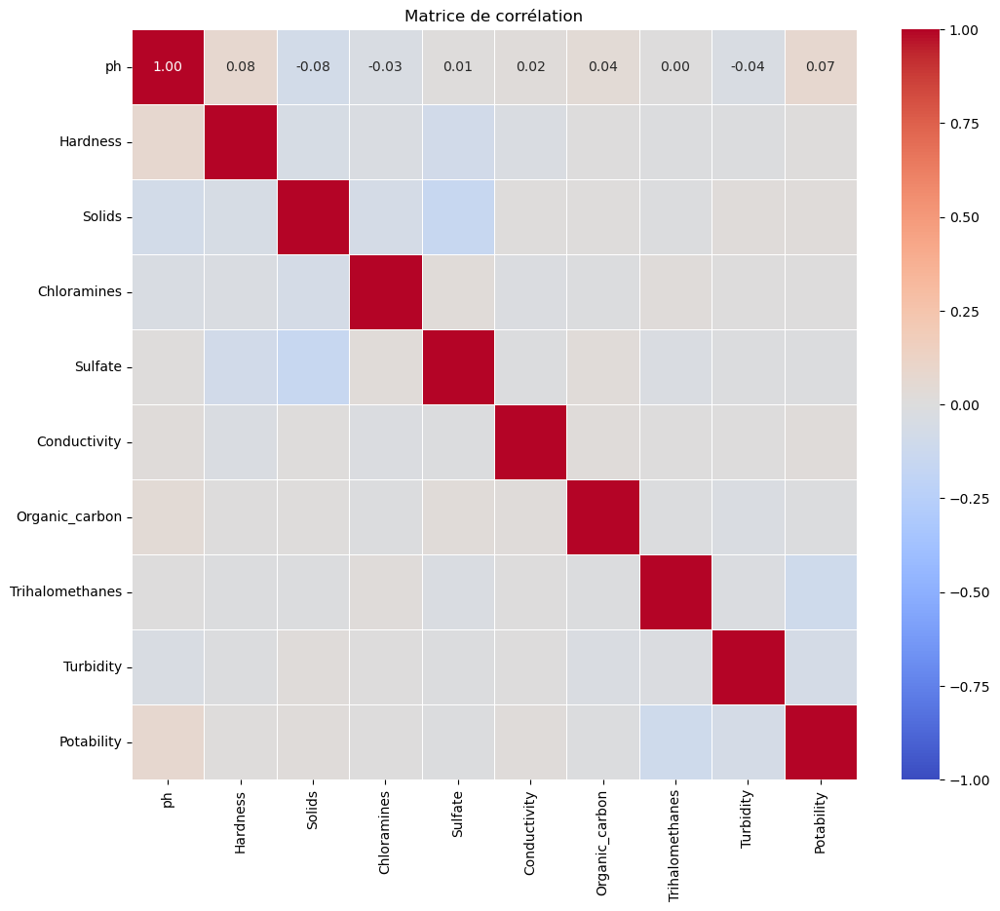

In [34]:
df_new_corr = df_new.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(df_new_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5,vmin=-1,vmax=1)
plt.title('Matrice de corrélation')
plt.show()


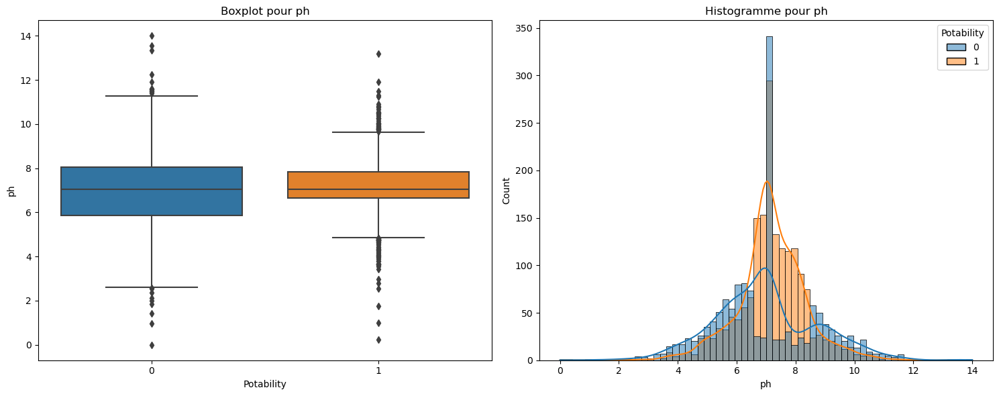

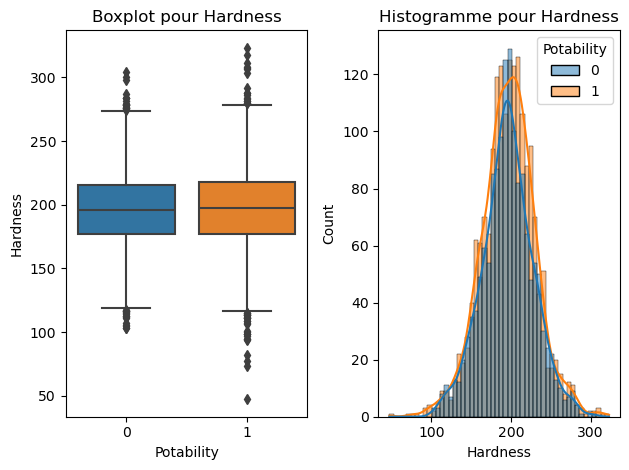

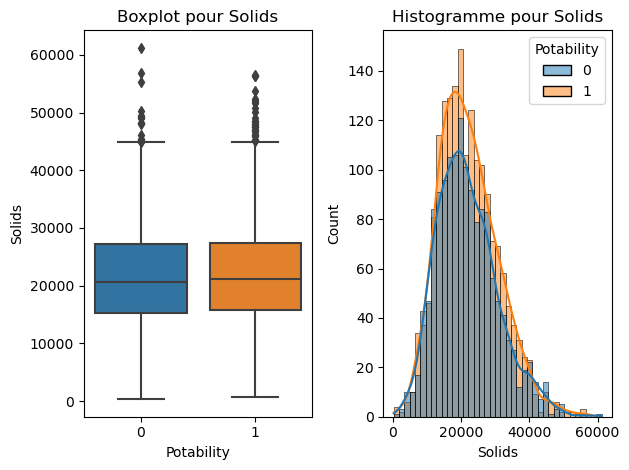

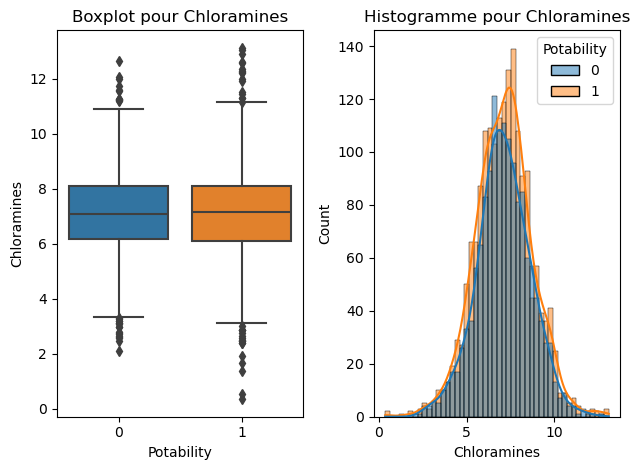

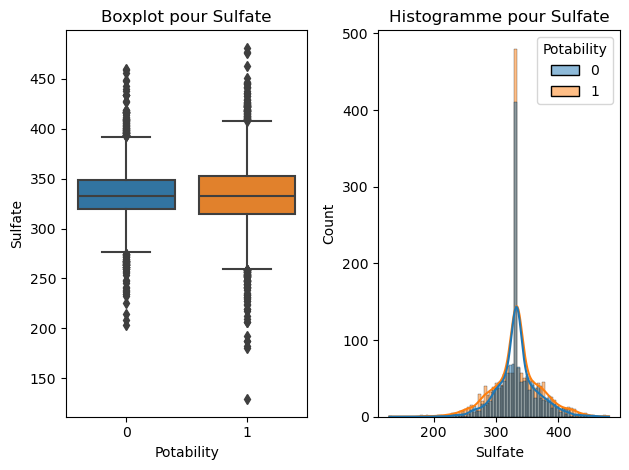

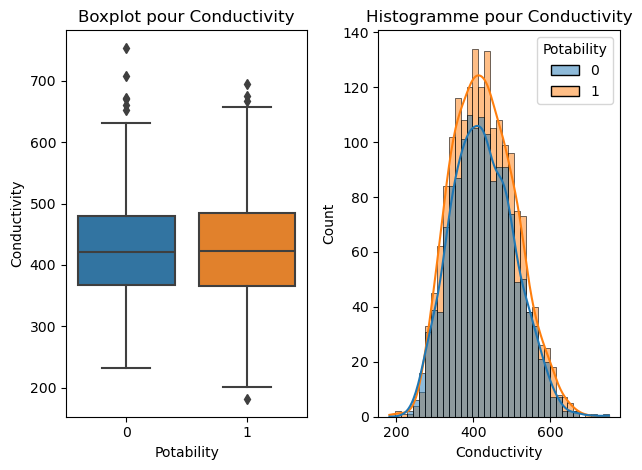

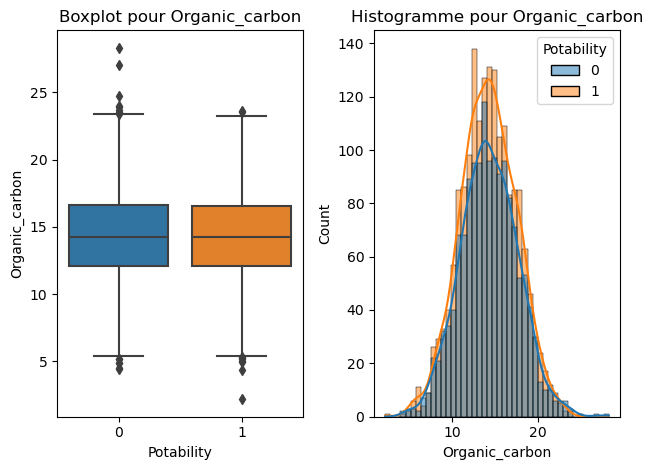

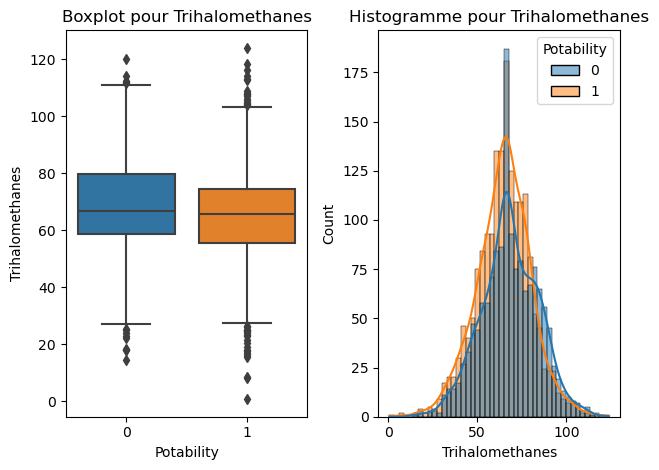

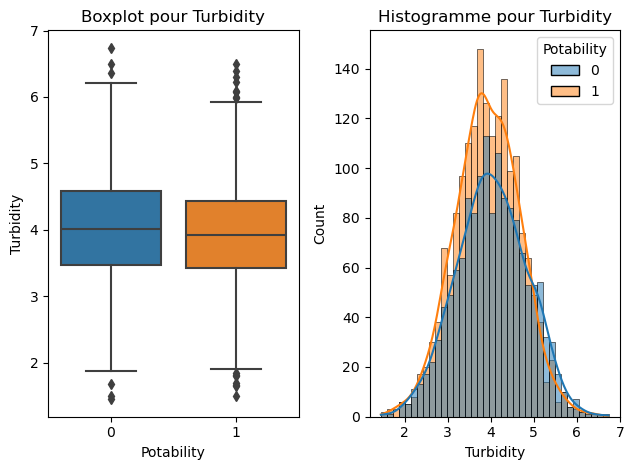

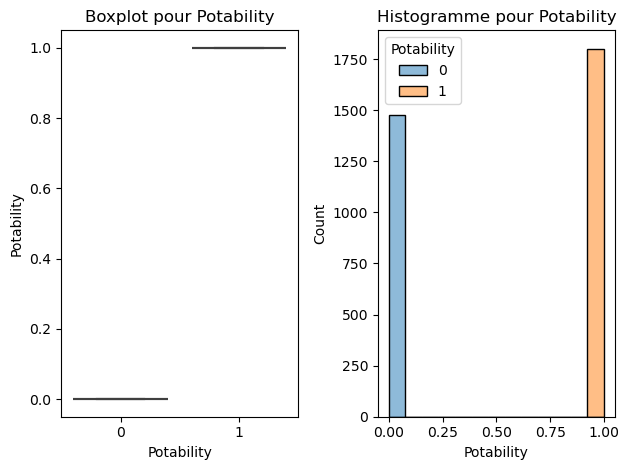

In [35]:
plt.figure(figsize=(15, 6))  

for col in df_new[:-1].columns:
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Potability', y=col, data=df_new)
    plt.title(f'Boxplot pour {col}')
    
    plt.subplot(1, 2, 2)
    sns.histplot(data=df_new, x=col, kde=True,hue='Potability')
    plt.title(f'Histogramme pour {col}')
    
    plt.tight_layout()  # Ajuste les espacements pour éviter les chevauchements
    plt.show()

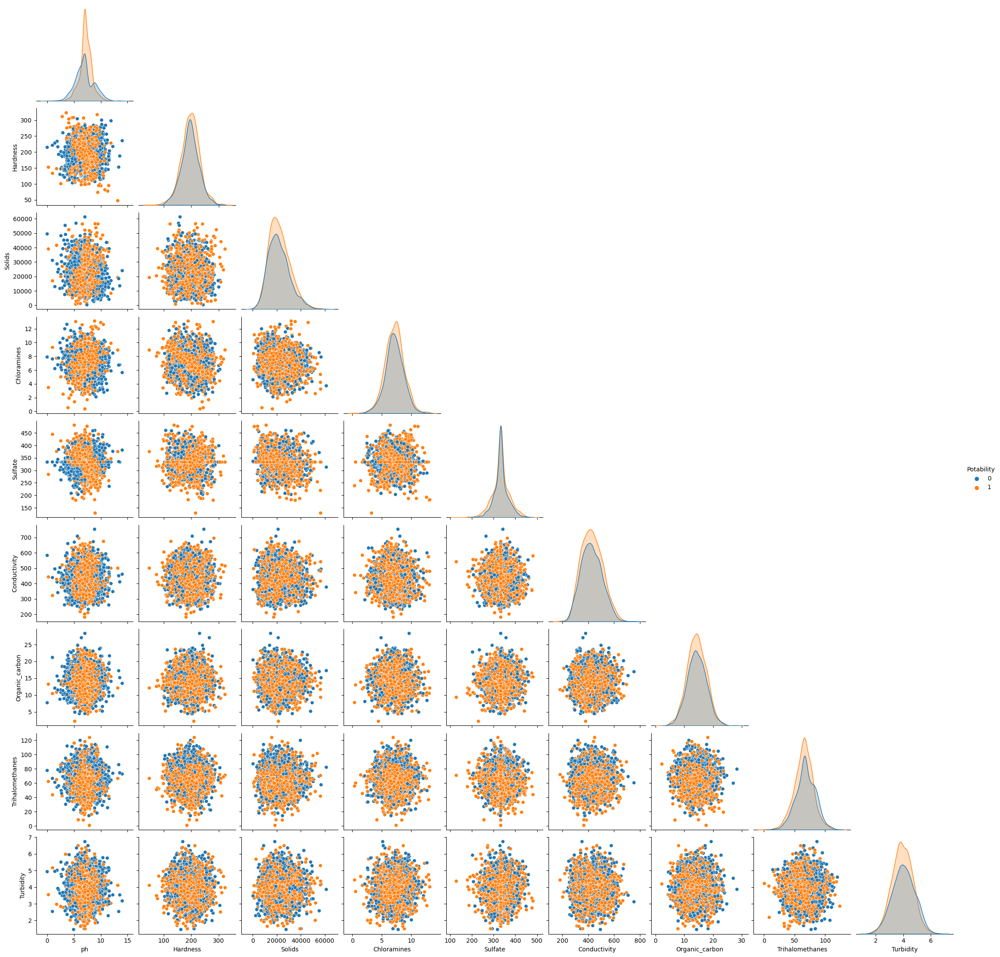

In [36]:
sns.pairplot(df_new,hue='Potability',corner=True)

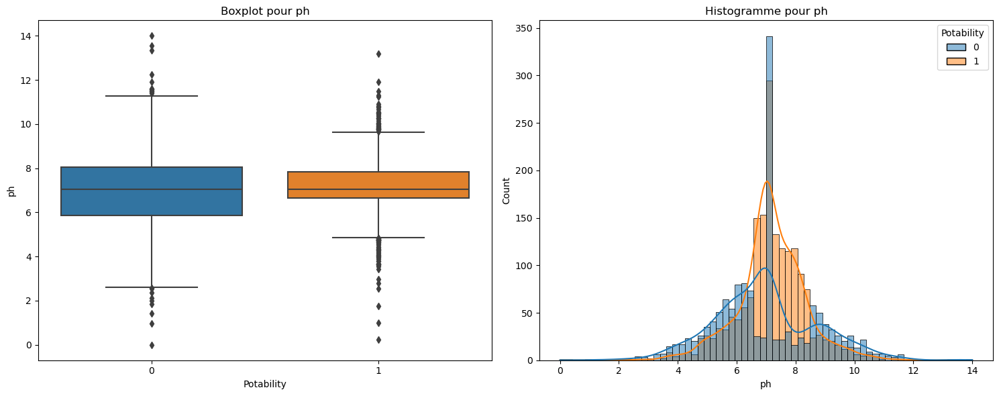

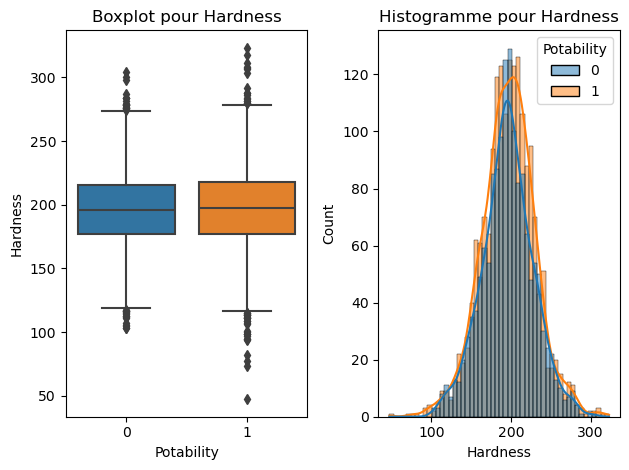

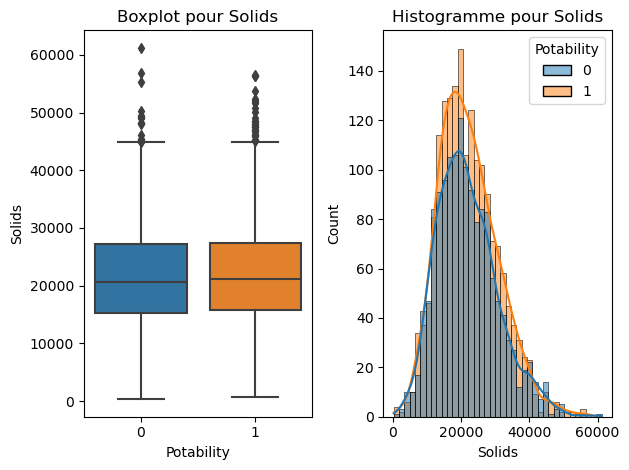

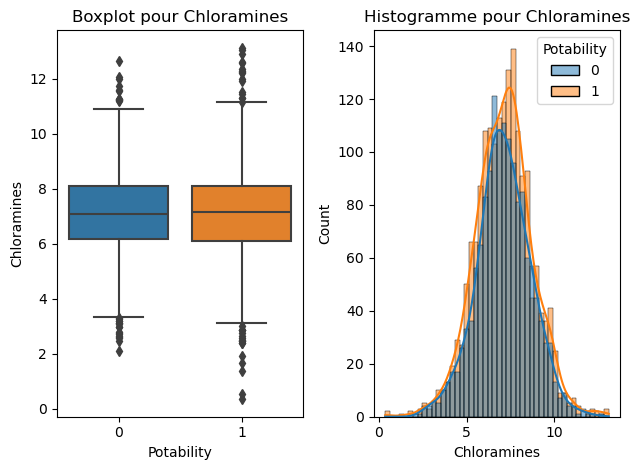

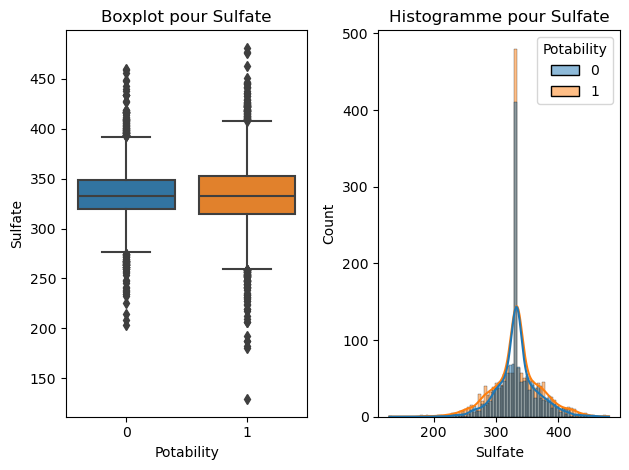

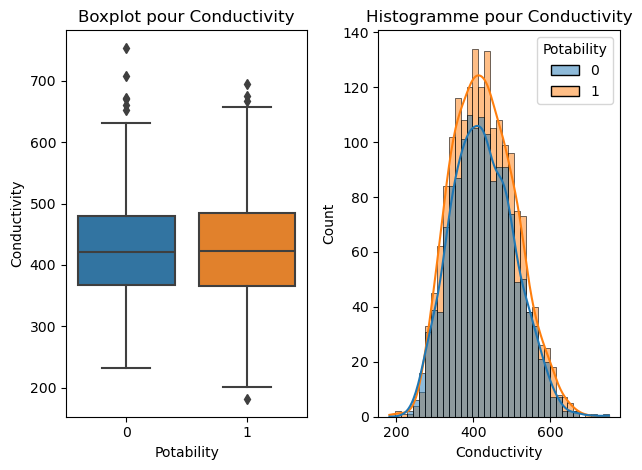

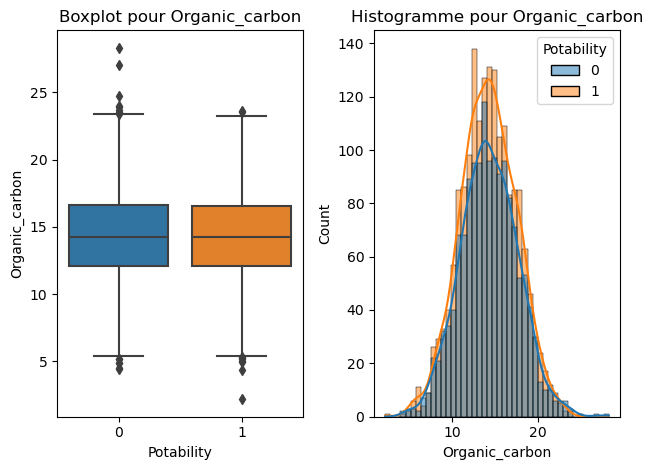

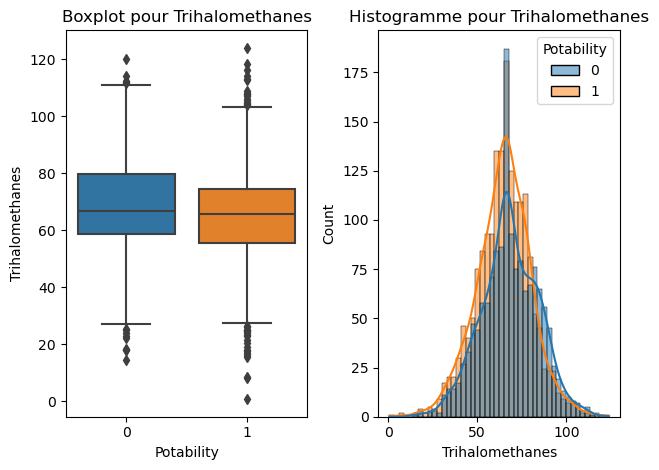

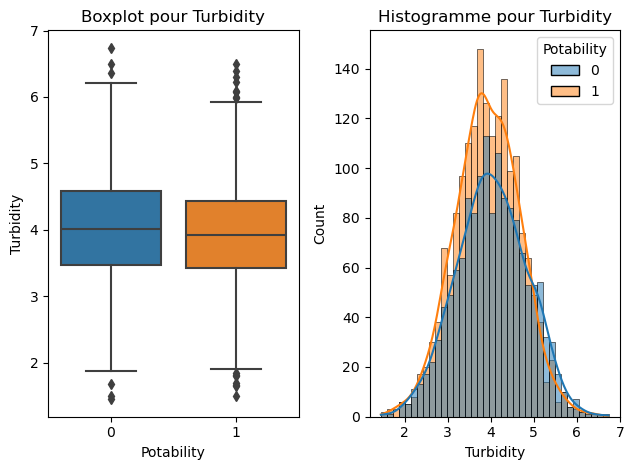

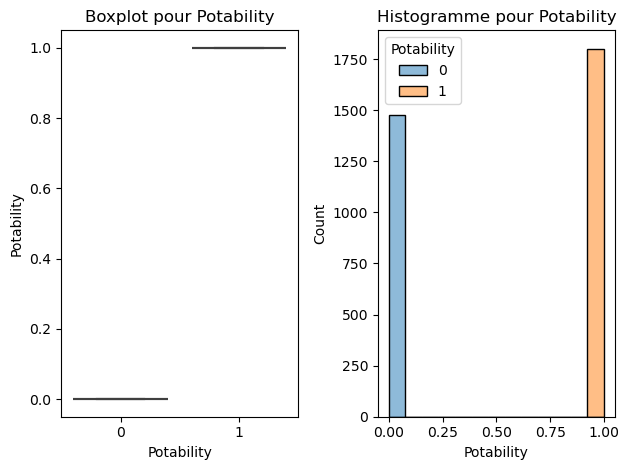

In [37]:
plt.figure(figsize=(15, 6))  

for col in df_new[:-1].columns:
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Potability', y=col, data=df_new)
    plt.title(f'Boxplot pour {col}')
    
    plt.subplot(1, 2, 2)
    sns.histplot(data=df_new, x=col, kde=True,hue='Potability')
    plt.title(f'Histogramme pour {col}')
    
    plt.tight_layout()  # Ajuste les espacements pour éviter les chevauchements
    plt.show()

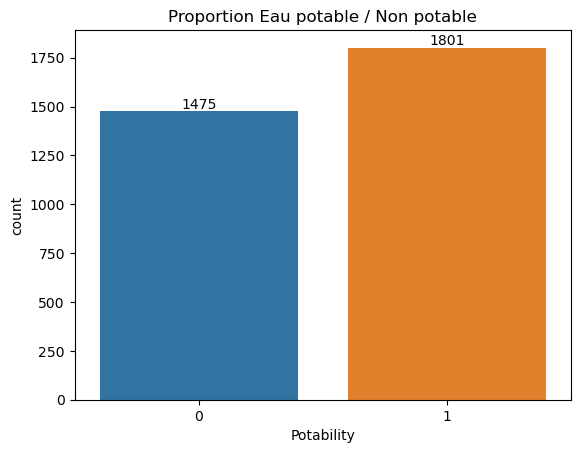

In [38]:
ax1 = sns.countplot(x='Potability', data=df)
ax1.bar_label(ax1.containers[0])
plt.title('Proportion Eau potable / Non potable')
plt.show()

## Préparation des données

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler, MinMaxScaler


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [41]:
def preprocessing(df,standardiser= StandardScaler()):
    X = df.drop('Potability', axis=1)
    y = df['Potability']
    x_col = X.columns
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    print("Taille de l'ensemble d'entraînement:", X_train.shape[0])
    print("Taille de l'ensemble de validation:", X_test.shape[0])
    
    print('Normalisation des données avec',standardiser)
    
    scaler = standardiser
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    
    ax = y_train.value_counts().plot.pie(autopct='%.2f')
    return X_train, X_test, y_train, y_test,x_col,scaler


Taille de l'ensemble d'entraînement: 2620
Taille de l'ensemble de validation: 656
Normalisation des données avec StandardScaler()


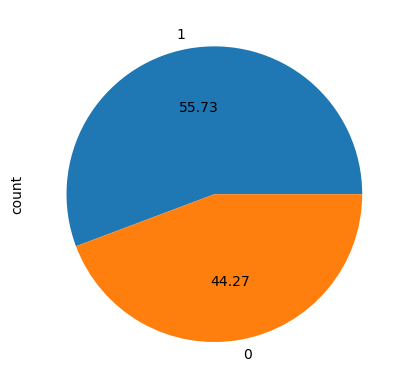

In [42]:
X_train, X_test, y_train, y_test,x_col,scaler = preprocessing(df)

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import gc
import time
import joblib
import sys
from contextlib import contextmanager
from datetime import datetime
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay    
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, balanced_accuracy_score, roc_auc_score, roc_curve,make_scorer, accuracy_score, f1_score, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier

import lightgbm as lgb

import mlflow
import mlflow.sklearn
import lime
import lime.lime_tabular

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Cette fonction est utilisée pour chronométrer des opérations 
### dans le code afin de mesurer les performances et d'optimiser le temps d'exécution.

@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))
    

### Définition de la fonction coût pour la validation croisée

def cost_function(y_test, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    cost = 10 * fp + fn
    return cost

def evaluate_classification_model(y_test, y_pred_optimal, y_proba):
       
    # Compute the accuracy score
    accuracy = accuracy_score(y_test, y_pred_optimal)
    
    # Compute the F1 score
    f1 = f1_score(y_test, y_pred_optimal)
    
    # Compute the precision score
    precision = precision_score(y_test, y_pred_optimal)
    
    # Compute the recall score
    recall = recall_score(y_test, y_pred_optimal)
    
    # Compute the AUC-ROC score
    auc = roc_auc_score(y_test, y_proba)
    
     # Compute le score de la fonction coût
    cost = cost_function(y_test, y_pred_optimal)
    
       
    # Store the results in a dictionary
    results = {
        "accuracy": accuracy,
        "f1_score": f1,
        "precision": precision,
        "recall": recall,
        "auc": auc,
        "cost": cost
       
    }
    
    return results

### Fonction qui affiche la courbe ROC et l'enregistre au format png

#def create_roc_auc_plot(model, X_test, y_test,y_pred,model_name):
#    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
#    roc_auc = metrics.auc(fpr, tpr)
#    display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,
#                                  estimator_name='example estimator')
#    plt.savefig(f'output_doc/roc_auc_curve_{model_name}.png')
#    plt.show()    
def create_roc_auc_plot(model, X_test, y_test, y_pred, model_name):
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
    roc_auc = metrics.auc(fpr, tpr)
    display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,
                                      estimator_name=model_name)
    display.plot()
    plt.title(f'ROC Curve - {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.savefig(f'output_doc/roc_auc_curve_{model_name}.png')
    plt.show()


### Fonction qui affiche la matrice de confusion et l'enregistre au format txt
def create_confusion_matrix_plot(model, y_pred, y_test, model_name):
    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=model.classes_)
    disp.plot()
    plt.title(f'Confusion Matrix - {model_name}')
    plt.savefig(f'output_doc/confusion_matrix_{model_name}.png')
    plt.show()

    
### Fonction qui affiche le rapport de classification et l'enregistre au format png

def create_classification_report(clf,test_y,y_pred_optimal,model_name):
    from sklearn.metrics import classification_report
    name = list(set(test_y))
    clsf_report = pd.DataFrame(classification_report(test_y, y_pred_optimal,target_names=name, output_dict=True)).round(2).transpose()
    print(clsf_report)
    clsf_report.to_string(f'output_doc/classification_report_{model_name}.txt',index=True)
    plt.savefig(f'output_doc/classification_report_{model_name}.png')
    
### Fonction qui permet d'afficher les features importances sur un modèle random forest
def feature_importance_rf(model,x_col,model_name):
    
    importance_data = pd.DataFrame()
    importance_data['features'] = x_col
    importance_data['importance']= model.feature_importances_
    # plot feature importance
    sns.barplot(data=importance_data[:15], y='features',x='importance')
    plt.savefig(f'output_doc/feature_importance_{model_name}.png')
    plt.show()

### Fonction qui permet d'afficher les features importances   

def feature_importance_reg(model, X_train,y_train,model_name):
    model.fit(X_train, y_train)
    indices = np.argsort(model.feature_importances_)[::-1]
    features = []
    for i in range(20):
        features.append(X_train.columns[indices[i]])

    sns.barplot(x=features, y=model.feature_importances_[indices[range(20)]], color=("orange"))
    plt.xlabel('Features importance')
    plt.xticks(rotation=90)
    plt.savefig(f'output_doc/feature_importance_{model_name}.png')
    plt.show()
    
### Fonction qui permet d'afficher les features importances du modèle dummy    
    
def feature_importance_dummy(model,x_col):
    
    importance_data = pd.DataFrame()
    importance_data['features'] = x_col
    importance_data['coef']= model.coef_
    # plot feature importance
    sns.barplot(data=importance_data[:15], y='features',x='coef')
    plt.show()
    
### Fonction qui permet d'entrainer le modèle random forest, calcul les métriques avant et après
### optimisation avec GridSearch CV

def random_forest(X_train,y_train,X_test,y_test):
    print('Création dun modèle ')
    rf_model = RandomForestClassifier(random_state=42)
    print('Entrainement du modèle sur X_train / y_train')
    rf_model.fit(X_train, y_train)
   
    y_pred = rf_model.predict(X_test)
    y_proba = rf_model.predict_proba(X_test)[:, 1]
        
    print('Optimisation du seuil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    y_pred_optimal = (y_proba >= optimal_threshold).astype(int)
    
    print('Scores du modèle avant optimisation')
    print(evaluate_classification_model(y_test, y_pred_optimal, y_proba))
    
    print('Affichage des features importances avant optimisation')
    print(feature_importance_rf(rf_model,x_col,'random_forest'))
    
    print('Affichage de la courbe Roc avant optimisation')
    print(create_roc_auc_plot(rf_model,X_test, y_test,y_pred_optimal,'random_forest'))
    
    print('Affichage du rapport de classification avant optimisation')
    print(create_classification_report(rf_model,y_test,y_pred_optimal,'random_forest'))
    
    print('Affichage de la matrice de confusion avant optimisation')
    print(create_confusion_matrix_plot(rf_model, y_pred_optimal, y_test,'random_forest'))
    
    print('Création d\'un dictionnaire pour optimiser les paramètres')
    
    class_counts = np.bincount(y_train)
    n_classes = len(class_counts)
    class_weights = {i: sum(class_counts)/class_counts[i] for i in range(n_classes)}
    
    # Optimisation du modèle 
    param_grid = {
    'n_estimators': [255,260],
    'max_depth': [13,14],
    'class_weight':['balanced',class_weights]   }
    
    print('Création d\'un dictionnaire de scoring')
      
    scoring = {
     'accuracy': make_scorer(accuracy_score),
    'recall': make_scorer(recall_score),
    'cost': make_scorer(cost_function),
    'precision' : make_scorer(precision_score)
    }
   
    # Création de l'objet GridSearchCV pour optimiser les hyperparamètres avec la fonction coût
    grid_search = GridSearchCV(rf_model, param_grid, scoring=scoring, cv=5,verbose=2, refit='precision')
    print('Execution de GridSearchCV sur le modèle')
    # Entraînement du modèle avec la validation croisée
    grid_search.fit(X_train, y_train)

    # affichage des résultats
    print("Best parameters: ", grid_search.best_params_)
    print("Best accuracy: ", grid_search.best_score_)
    print("Best recall: ", grid_search.cv_results_['mean_test_recall'][grid_search.best_index_])
    print("Best cost: ", grid_search.cv_results_['mean_test_cost'][grid_search.best_index_])
    print("Best precision score: ", grid_search.cv_results_['mean_test_precision'][grid_search.best_index_])
    
    # Entraînement du modèle sur les données d'entraînement avec les meilleurs hyperparamètres trouvés
    print('Ajustement du modèle avec les paramètres optimisés')
    best_rf_model = grid_search.best_estimator_
    best_rf_model.fit(X_train, y_train)

    
    y_pred_best = best_rf_model.predict(X_test)
    y_proba_best = best_rf_model.predict_proba(X_test)[:, 1]
    
    print('Optimisation du seil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba_best)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]

    # Prédire les classes pour l'ensemble de test avec le seuil de classification optimal
    y_pred_optimal_best = (y_proba_best >= optimal_threshold).astype(int)
    print('Scores du modèle après optimisation')
    
    results = evaluate_classification_model(y_test, y_pred_optimal_best, y_proba_best)
     # Enregistrement des metrics dans une dataframe
    results_df = pd.DataFrame(columns=['Modèle', 'Best accuracy', 'Best recall', 'Best cost','Best precision Score'])
    # Ajouter les résultats de la recherche de grille à la dataframe
    results_df.loc[0] = ['Random forest',grid_search.best_score_, 
                         grid_search.cv_results_['mean_test_recall'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_cost'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_precision'][grid_search.best_index_]]
    
    
    print(results_df)
    print('Affichage des features importances après optimisation')
    print(feature_importance_rf(best_rf_model,x_col,'random_forest'))
    
    print('Affichage de la courbe Roc après optimisation')
    print(create_roc_auc_plot(best_rf_model,X_test, y_test,y_pred_optimal_best,'random_forest'))
    
    print('Affichage du rapport de classification après optimisation')
    print(create_classification_report(best_rf_model,y_test,y_pred_optimal_best,'random_forest'))
    
    print('Affichage de la matrice de confusion après optimisation')
    print(create_confusion_matrix_plot(best_rf_model, y_pred_optimal_best, y_test,'random_forest'))  
    
    return y_pred_optimal, y_proba, rf_model, y_pred_optimal_best, y_proba_best, best_rf_model, results, results_df

### Fonction équivalente à random forest pour le dummy Classifier

def modele_dummy(X_train,y_train,X_test,y_test):
    dummy_clf = DummyClassifier(strategy="most_frequent",random_state=0)
    dummy_clf.fit(X_train, y_train)
    y_pred_dummy = dummy_clf.predict(X_test)
    y_pred_proba_dummy = dummy_clf.predict_proba(X_test)[:, 1]
    dummy_score = dummy_clf.score(X_train,y_train)
    
    print('Optimisation du seuil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_dummy)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    y_pred_optimal_dummy = (y_pred_proba_dummy>= optimal_threshold).astype(int)
    
    print('Scores du modèle ')
    print(evaluate_classification_model(y_test, y_pred_optimal_dummy, y_pred_proba_dummy))
    results = evaluate_classification_model(y_test, y_pred_optimal_dummy, y_pred_proba_dummy)    
    
    print('Affichage de la courbe Roc ')
    print(create_roc_auc_plot(dummy_clf,X_test, y_test,y_pred_optimal_dummy,'dummy'))
    
    print('Affichage du rapport de classification ')
    print(create_classification_report(dummy_clf,y_test,y_pred_optimal_dummy,'dummy'))
    
    print('Affichage de la matrice de confusion')
    print(create_confusion_matrix_plot(dummy_clf, y_pred_optimal_dummy, y_test,'dummy'))
    
    
    return dummy_clf, y_pred_optimal_dummy,y_pred_proba_dummy, results

# Fonction équivalente à random forest adaptée à lightgbm

def lightgbm(X_train,y_train,X_test,y_test):
    
    print('Création d\'un modèle LGBM ')
    
    lgb_model = lgb.LGBMClassifier(random_state=42,num_leaves=5)
    
    
    print('Entrainement du modèle sur X_train / y_train')
    
    lgb_model.fit(X_train, y_train)
   
    y_pred = lgb_model.predict(X_test)
    y_proba = lgb_model.predict_proba(X_test)[:, 1]
        
    print('Optimisation du seuil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    y_pred_optimal = (y_proba >= optimal_threshold).astype(int)
    
    print('Scores du modèle avant optimisation')
    print(evaluate_classification_model(y_test, y_pred_optimal, y_proba))
    
    print('Affichage des features importances avant optimisation')
    print(feature_importance_rf(lgb_model,x_col,'lgb'))
    
    print('Affichage de la courbe Roc avant optimisation')
    print(create_roc_auc_plot(lgb_model,X_test,y_test,y_pred_optimal,'lgb'))
    
    print('Affichage du rapport de classification avant optimisation')
    print(create_classification_report(lgb_model,y_test,y_pred_optimal,'lgb'))
    
    print('Affichage de la matrice de confusion avant optimisation')
    print(create_confusion_matrix_plot(lgb_model, y_pred_optimal, y_test,'lgb'))
    
        
    print('Création d\'un dictionnaire pour optimiser les paramètres')
    # Optimisation du modèle 
    param_grid = {
      'max_depth': [2,3],
    'learning_rate': [0.2,0.3],
    'n_estimators': [100,150],
    'num_leaves': [2,4,6],
    'scale_pos_weight': [None, 10]   
    }
    
    print('Création d\'un dictionnaire de scoring')
      
    scoring = {
     'accuracy': make_scorer(accuracy_score),
    'recall': make_scorer(recall_score),
    'cost': make_scorer(cost_function),
    'precision' : make_scorer(precision_score)
    }
   
    # Création de l'objet GridSearchCV pour optimiser les hyperparamètres avec la fonction coût
    grid_search = GridSearchCV(lgb_model, param_grid, scoring=scoring, cv=2,verbose=0, refit='precision')
    print('Execution de GridSearchCV sur le modèle')
    # Entraînement du modèle avec la validation croisée
    grid_search.fit(X_train, y_train)

    # affichage des résultats
    print("Best parameters: ", grid_search.best_params_)
    print("Best accuracy: ", grid_search.best_score_)
    print("Best recall: ", grid_search.cv_results_['mean_test_recall'][grid_search.best_index_])
    print("Best cost: ", grid_search.cv_results_['mean_test_cost'][grid_search.best_index_])
    print("Best precision score : ",grid_search.cv_results_['mean_test_precision'][grid_search.best_index_])
    
    
    # Entraînement du modèle sur les données d'entraînement avec les meilleurs hyperparamètres trouvés
    print('Ajustement du modèle avec les paramètres optimisés')
    best_lgb_model = grid_search.best_estimator_
    best_lgb_model.fit(X_train, y_train)

    
    y_pred_best = best_lgb_model.predict(X_test)
    y_proba_best = best_lgb_model.predict_proba(X_test)[:, 1]
    
    print('Optimisation du seil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba_best)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]

    # Prédire les classes pour l'ensemble de test avec le seuil de classification optimal
    y_pred_optimal_best = (y_proba_best >= optimal_threshold).astype(int)
    print('Scores du modèle après optimisation')
    
    #print(evaluate_classification_model(y_test, y_pred_optimal_best, y_proba_best))
    
    results = evaluate_classification_model(y_test, y_pred_optimal_best, y_proba_best)
    
    # Enregistrement des metrics dans une dataframe
    results_df = pd.DataFrame(columns=['Modèle', 'Best accuracy','Best recall', 'Best cost', 'Best precision score'])
    # Ajouter les résultats de la recherche de grille à la dataframe
    results_df.loc[0] = ['Lightgbm', grid_search.best_score_, 
                         grid_search.cv_results_['mean_test_recall'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_cost'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_precision'][grid_search.best_index_]]
    print(results_df)
    
    print('Affichage des features importances après optimisation')
    print(feature_importance_rf(best_lgb_model,x_col,'lgb'))
    
    print('Affichage de la courbe Roc après optimisation')
    print(create_roc_auc_plot(best_lgb_model,X_test, y_test,y_pred_optimal_best,'lgb'))
    
    print('Affichage du rapport de classification après optimisation')
    print(create_classification_report(best_lgb_model,y_test,y_pred_optimal_best,'lgb'))
    
    print('Affichage de la matrice de confusion après optimisation')
    print(create_confusion_matrix_plot(best_lgb_model, y_pred_optimal_best, y_test,'lgb'))
       
    return y_pred_optimal, y_proba, lgb_model, y_pred_optimal_best, y_proba_best, best_lgb_model, results, results_df


### Fonction équivalente à random forest adaptée à une regression logistique
def logistic_regression(X_train, y_train, X_test, y_test):
    print('Création d\'un modèle de régression logistique')
    logreg_model = LogisticRegression(random_state=42, max_iter=1000)
    
    print('Entrainement du modèle sur X_train / y_train')
    logreg_model.fit(X_train, y_train)

    y_pred = logreg_model.predict(X_test)
    y_proba = logreg_model.predict_proba(X_test)[:, 1]
        
    print('Optimisation du seuil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    y_pred_optimal = (y_proba >= optimal_threshold).astype(int)
    
    print('Scores du modèle avant optimisation')
    print(evaluate_classification_model(y_test, y_pred_optimal, y_proba))
    
    print('Affichage de la courbe Roc avant optimisation')
    print(create_roc_auc_plot(logreg_model,X_test, y_test,y_pred_optimal,'log_reg'))
    
    print('Affichage du rapport de classification avant optimisation')
    print(create_classification_report(logreg_model,y_test,y_pred_optimal,'log_reg'))
    
    print('Affichage de la matrice de confusion avant optimisation')
    print(create_confusion_matrix_plot(logreg_model, y_pred_optimal, y_test,'log_reg'))
    
    print('Création d\'un dictionnaire pour optimiser les paramètres')
    
    class_counts = np.bincount(y_train)
    n_classes = len(class_counts)
    class_weights = {i: sum(class_counts)/class_counts[i] for i in range(n_classes)}
    
    # Optimisation du modèle 
    param_grid = {
    'penalty': ['l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'class_weight':['balanced', class_weights]   
    }
    
    print('Création d\'un dictionnaire de scoring')
    
    scoring = {
     'accuracy': make_scorer(accuracy_score),
    'recall': make_scorer(recall_score),
    'cost': make_scorer(cost_function),
    'precision' : make_scorer(precision_score)
    }
    
    # Création de l'objet GridSearchCV pour optimiser les hyperparamètres avec la fonction coût
    grid_search = GridSearchCV(logreg_model, param_grid, scoring=scoring, cv=5,verbose=2, refit='precision')
    print('Execution de GridSearchCV sur le modèle')
    # Entraînement du modèle avec la validation croisée
    grid_search.fit(X_train, y_train)

    # affichage des résultats
    print("Best parameters: ", grid_search.best_params_)
    print("Best accuracy: ", grid_search.best_score_)
    print("Best recall: ", grid_search.cv_results_['mean_test_recall'][grid_search.best_index_])
    print("Best cost: ", grid_search.cv_results_['mean_test_cost'][grid_search.best_index_])
    print("Best precision score: ", grid_search.cv_results_['mean_test_precision'][grid_search.best_index_])
    
    # Entraînement du modèle sur les données d'entraînement avec les meilleurs hyperparamètres trouvés
    print('Ajustement du modèle avec les paramètres optimisés')
    best_lr_model = grid_search.best_estimator_
    best_lr_model.fit(X_train, y_train)

    y_pred_best = best_lr_model.predict(X_test)
    y_proba_best = best_lr_model.predict_proba(X_test)[:, 1]
    
    print('Optimisation du seuil de classification pour maximiser l\'AUC')      
    # Optimiser le seuil de classification pour maximiser l'AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_proba_best)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]

    # Prédire les classes pour l'ensemble de test avec le seuil de classification optimal
    y_pred_optimal_best = (y_proba_best >= optimal_threshold).astype(int)
    print('Scores du modèle après optimisation')
    
    results = evaluate_classification_model(y_test, y_pred_optimal_best, y_proba_best)
    # Enregistrement des metrics dans une dataframe
    results_df = pd.DataFrame(columns=['Modèle', 'Best accuracy', 'Best recall', 'Best cost','Best precision Score'])
    # Ajouter les résultats de la recherche de grille à la dataframe
    results_df.loc[0] = ['Logistic Regression', grid_search.best_score_, 
                         grid_search.cv_results_['mean_test_recall'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_cost'][grid_search.best_index_], 
                         grid_search.cv_results_['mean_test_precision'][grid_search.best_index_]]
    
    print(results_df)
    print('Affichage de la courbe Roc après optimisation')
    print(create_roc_auc_plot(best_lr_model,X_test, y_test,y_pred_optimal_best,'log_reg'))
    
    print('Affichage du rapport de classification après optimisation')
    print(create_classification_report(best_lr_model,y_test,y_pred_optimal_best,'log_reg'))
    
    print('Affichage de la matrice de confusion après optimisation')
    print(create_confusion_matrix_plot(best_lr_model, y_pred_optimal_best, y_test,'log_reg'))  
    
    return y_pred_optimal, y_proba, logreg_model, y_pred_optimal_best, y_proba_best, best_lr_model, results, results_df

### Fonction qui permet de créer une expérience sur MlFlow

def create_experiment(experiment_name, run_metrics,model,model_name, 
                      confusion_matrix_path = None, roc_auc_plot_path = None, 
                      classification_report_plot_path = None,feature_importance_path=None,
                      run_params=None, mode='Standardscaler'):
        
    mlflow.set_tracking_uri("http://localhost:5000") 
    mlflow.set_experiment(experiment_name)
    
    ## Define the name of our run
    now = datetime.now()
    dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
    name = experiment_name +'_'+ mode +'_'+ dt_string
    
    with mlflow.start_run(run_name=experiment_name+'_'+ mode ):
        
        if not run_params == None:
            for param in run_params:
                mlflow.log_param(param, run_params[param])
            
        for metric in run_metrics:
            mlflow.log_metric(metric, run_metrics[metric])
        
        mlflow.sklearn.log_model(model, "model")
        
        if not confusion_matrix_path == None:
            mlflow.log_artifact(confusion_matrix_path, f'confusion_matrix_{model_name}.png')
            
        if not classification_report_plot_path == None:
            mlflow.log_artifact(classification_report_plot_path, f'classification report_{model_name}.txt')
            
        if not roc_auc_plot_path == None:
            mlflow.log_artifact(roc_auc_plot_path, f"roc_auc_plot_{model_name}.png")
        
        if not feature_importance_path == None:
            mlflow.log_artifact(feature_importance_path, f"feature_importance_{model_name}.png")
        
        mlflow.set_tag("tag1", experiment_name)
        
            
    print('Run - %s is logged to Experiment - %s' %(name +'_'+ mode, experiment_name))

Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle 
{'accuracy': 0.4801829268292683, 'f1_score': 0.0, 'precision': 0.0, 'recall': 0.0, 'auc': 0.5, 'cost': 341}
Affichage de la courbe Roc 


/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


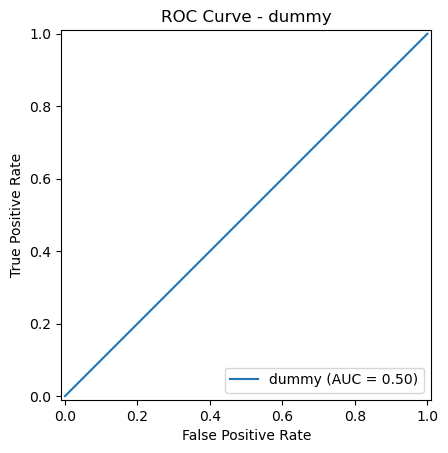

None
Affichage du rapport de classification 
              precision  recall  f1-score  support
0                  0.48    1.00      0.65   315.00
1                  0.00    0.00      0.00   341.00
accuracy           0.48    0.48      0.48     0.48
macro avg          0.24    0.50      0.32   656.00
weighted avg       0.23    0.48      0.31   656.00
None
Affichage de la matrice de confusion


/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", le

<Figure size 640x480 with 0 Axes>

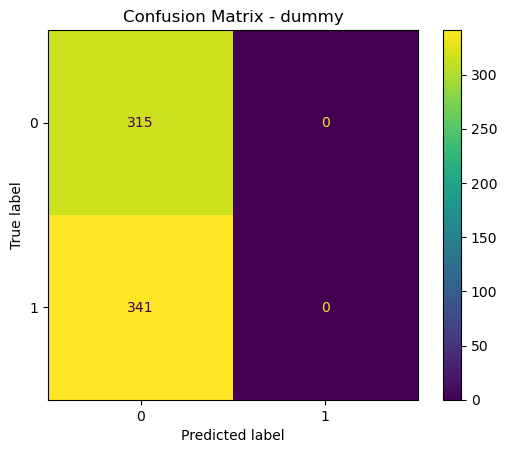

None


In [44]:
dummy_clf, y_pred_optimal_dummy,y_pred_proba_dummy,results_dummy = modele_dummy(X_train,y_train,X_test,y_test)

Création dun modèle 
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle avant optimisation
{'accuracy': 0.788109756097561, 'f1_score': 0.7687188019966722, 'precision': 0.8884615384615384, 'recall': 0.6774193548387096, 'auc': 0.8492156588930783, 'cost': 400}
Affichage des features importances avant optimisation


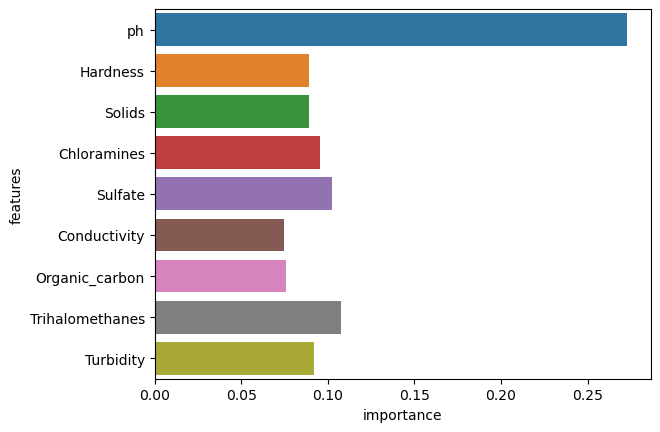

None
Affichage de la courbe Roc avant optimisation


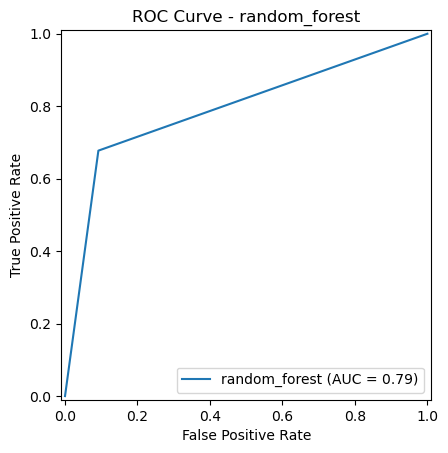

None
Affichage du rapport de classification avant optimisation
              precision  recall  f1-score  support
0                  0.72    0.91      0.80   315.00
1                  0.89    0.68      0.77   341.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.81    0.79      0.79   656.00
weighted avg       0.81    0.79      0.79   656.00
None
Affichage de la matrice de confusion avant optimisation


<Figure size 640x480 with 0 Axes>

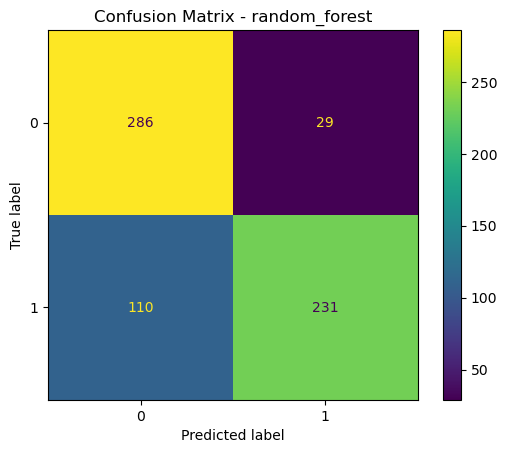

None
Création d'un dictionnaire pour optimiser les paramètres
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END class_weight=balanced, max_depth=13, n_estimators=255; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=255; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=255; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=255; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=255; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=260; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=260; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=260; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estimators=260; total time=   0.8s
[CV] END class_weight=balanced, max_depth=13, n_estim

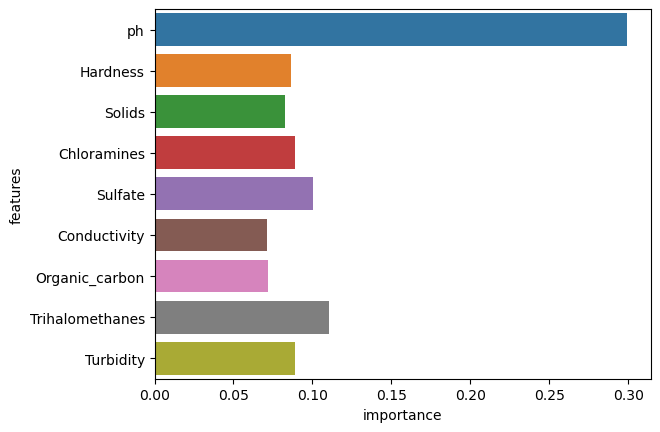

None
Affichage de la courbe Roc après optimisation


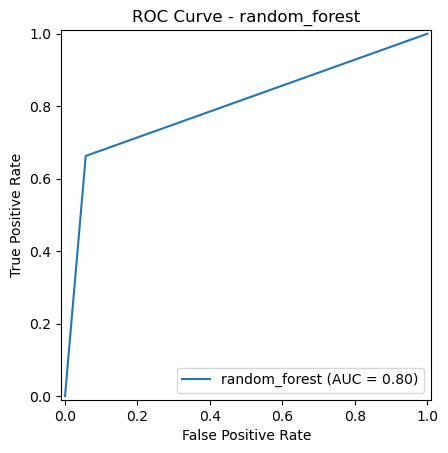

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.72    0.94      0.82    315.0
1                  0.93    0.66      0.77    341.0
accuracy           0.80    0.80      0.80      0.8
macro avg          0.82    0.80      0.79    656.0
weighted avg       0.83    0.80      0.79    656.0
None
Affichage de la matrice de confusion après optimisation


<Figure size 640x480 with 0 Axes>

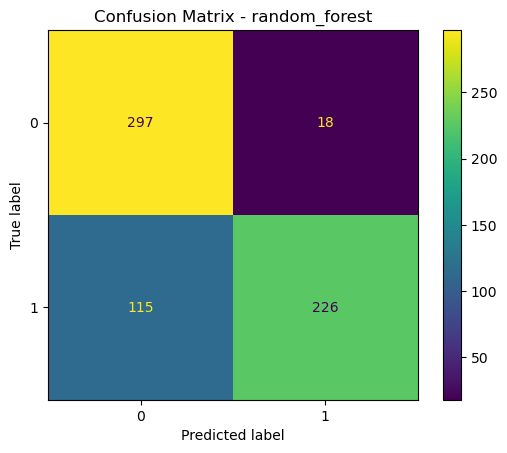

None


In [45]:
y_pred_optimal, y_proba, rf_model, y_pred_optimal_best, y_proba_best, best_rf_model,results_rf, df_result_rf = random_forest(X_train,y_train,X_test,y_test)

Création d'un modèle LGBM 
Entrainement du modèle sur X_train / y_train
[LightGBM] [Info] Number of positive: 1460, number of negative: 1160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 2620, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle avant optimisation
{'accuracy': 0.7896341463414634, 'f1_score': 0.7544483985765125, 'precision': 0.9592760180995475, 'recall': 0.6217008797653959, 'auc': 0.8425406135083555, 'cost': 219}
Affichage des features importances avant optimisation


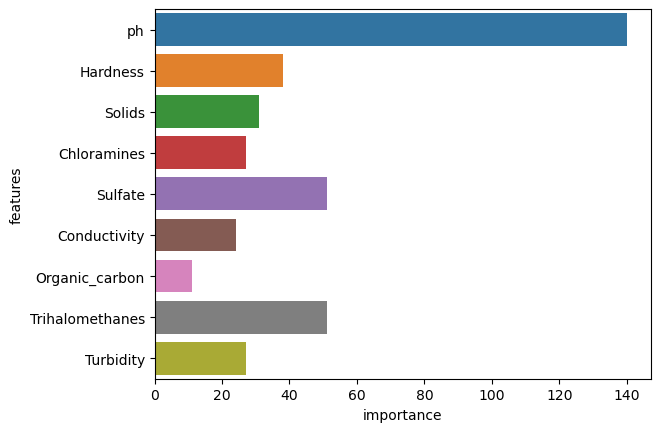

None
Affichage de la courbe Roc avant optimisation


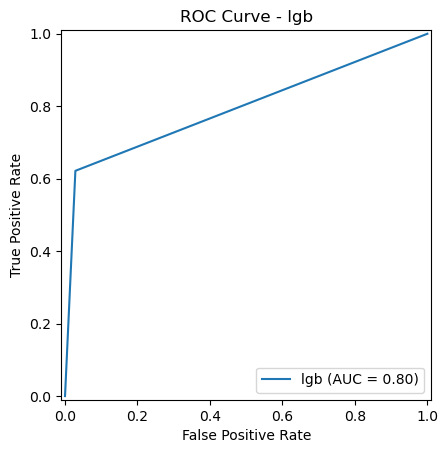

None
Affichage du rapport de classification avant optimisation
              precision  recall  f1-score  support
0                  0.70    0.97      0.82   315.00
1                  0.96    0.62      0.75   341.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.83    0.80      0.79   656.00
weighted avg       0.84    0.79      0.78   656.00
None
Affichage de la matrice de confusion avant optimisation


<Figure size 640x480 with 0 Axes>

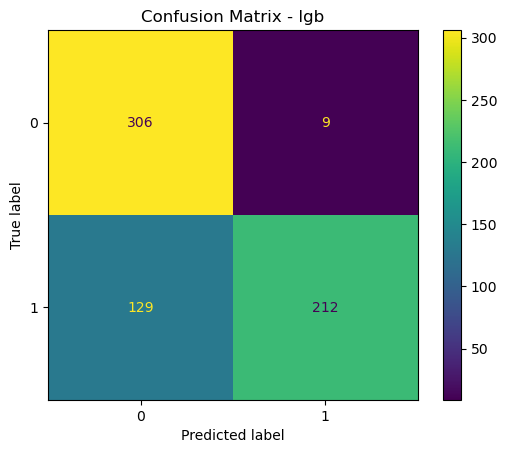

None
Création d'un dictionnaire pour optimiser les paramètres
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of 

[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number o

[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of positive: 730, number of negative: 580
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1310, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
[LightGBM] [Info] Number of 

Best parameters:  {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 150, 'num_leaves': 4, 'scale_pos_weight': None}
Best accuracy:  0.7744716117524316
Best recall:  0.7315068493150685
Best cost:  1751.0
Best precision score :  0.7744716117524316
Ajustement du modèle avec les paramètres optimisés
[LightGBM] [Info] Number of positive: 1460, number of negative: 1160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 2620, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.557252 -> initscore=0.230016
[LightGBM] [Info] Start training from score 0.230016
Optimisation du seil de classification pour maximiser l'AUC
Scores du modèle après optimisation
     Modèle  Best accuracy  Best recall  Best cost  Best precision score
0  Lightgbm       0.774472     0.731507  

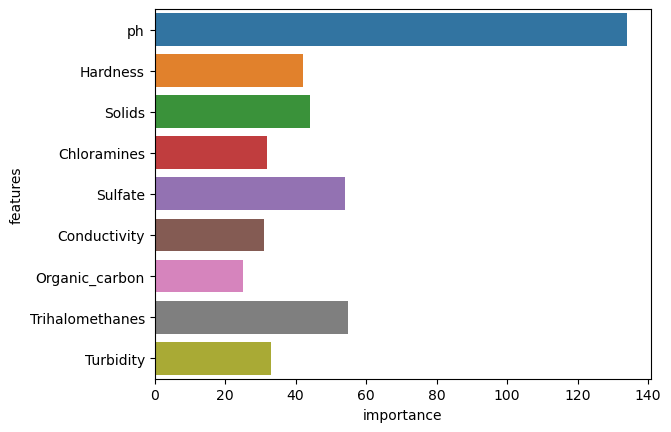

None
Affichage de la courbe Roc après optimisation


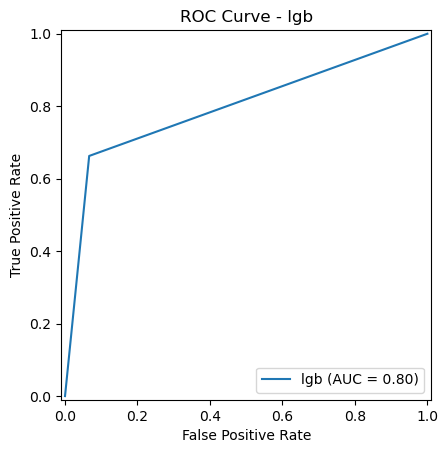

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.72    0.93      0.81   315.00
1                  0.91    0.66      0.77   341.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.82    0.80      0.79   656.00
weighted avg       0.82    0.79      0.79   656.00
None
Affichage de la matrice de confusion après optimisation


<Figure size 640x480 with 0 Axes>

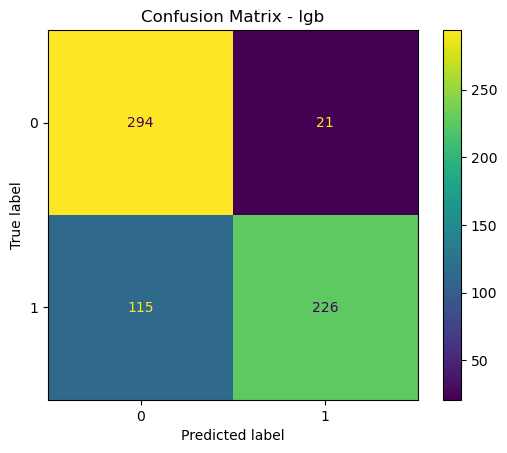

None


In [46]:
y_pred_optimal, y_proba, lgb_model, y_pred_optimal_best, y_proba_best, best_lgb_model, results_lgb, df_result_lgb = lightgbm(X_train,y_train,X_test,y_test)

Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle avant optimisation
{'accuracy': 0.6173780487804879, 'f1_score': 0.65283540802213, 'precision': 0.6178010471204188, 'recall': 0.6920821114369502, 'auc': 0.6116929665316762, 'cost': 1565}
Affichage de la courbe Roc avant optimisation


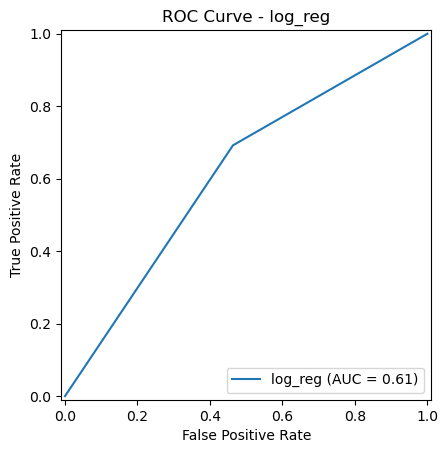

None
Affichage du rapport de classification avant optimisation
              precision  recall  f1-score  support
0                  0.62    0.54      0.57   315.00
1                  0.62    0.69      0.65   341.00
accuracy           0.62    0.62      0.62     0.62
macro avg          0.62    0.61      0.61   656.00
weighted avg       0.62    0.62      0.61   656.00
None
Affichage de la matrice de confusion avant optimisation


<Figure size 640x480 with 0 Axes>

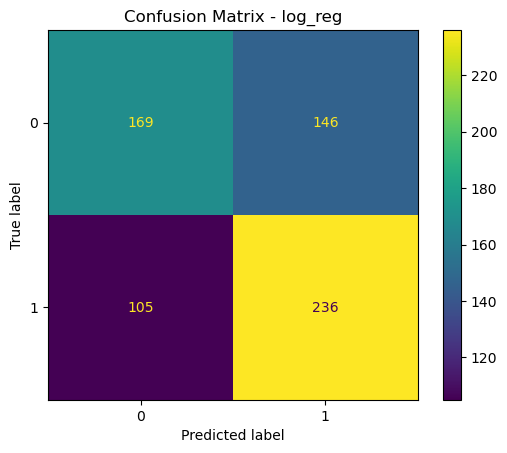

None
Création d'un dictionnaire pour optimiser les paramètres
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END .........C=0.001, class_weight=balanced, penalty=l2; total time=   0.0s
[CV] END .........C=0.001, class_weight=balanced, penalty=l2; total time=   0.0s
[CV] END .........C=0.001, class_weight=balanced, penalty=l2; total time=   0.0s
[CV] END .........C=0.001, class_weight=balanced, penalty=l2; total time=   0.0s
[CV] END .........C=0.001, class_weight=balanced, penalty=l2; total time=   0.0s
[CV] END C=0.001, class_weight={0: 2.2586206896551726, 1: 1.7945205479452055}, penalty=l2; total time=   0.0s
[CV] END C=0.001, class_weight={0: 2.2586206896551726, 1: 1.7945205479452055}, penalty=l2; total time=   0.0s
[CV] END C=0.001, class_weight={0: 2.2586206896551726, 1: 1.7945205479452055}, penalty=l2; total time=   0.0s
[CV] END C=0.001, class_weight={0: 2.2586206896551726, 1: 1.7945

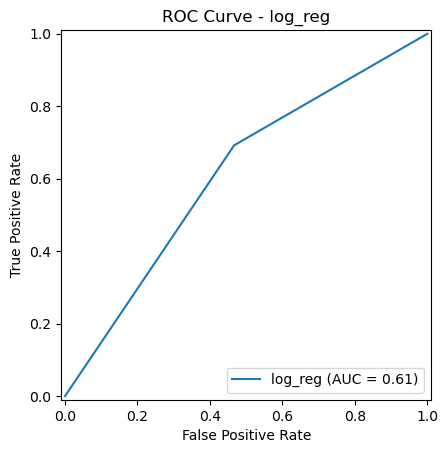

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.62    0.53      0.57   315.00
1                  0.62    0.69      0.65   341.00
accuracy           0.62    0.62      0.62     0.62
macro avg          0.62    0.61      0.61   656.00
weighted avg       0.62    0.62      0.61   656.00
None
Affichage de la matrice de confusion après optimisation


<Figure size 640x480 with 0 Axes>

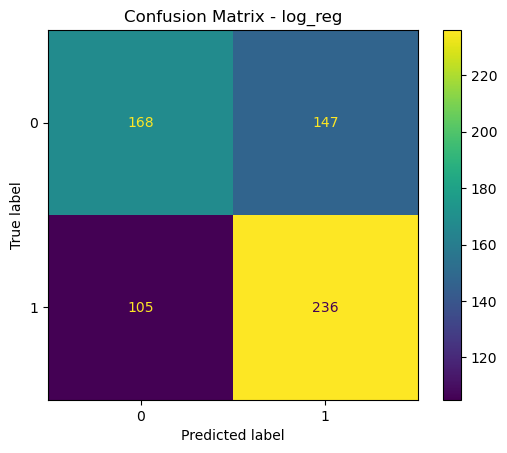

None


In [47]:
y_pred_optimal, y_proba, log_reg_model, y_pred_optimal_best, y_proba_best, best_log_reg_model, results_log_reg, df_result_log_reg = logistic_regression(X_train,y_train,X_test,y_test)

In [48]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_test,
                                                      mode = 'classification', 
                                                      feature_names = x_col,
                                                      class_names  = ['Non Potable', 'Potable'],
                                                      random_state = 42
                                                      )



In [61]:
best_log_reg_model_explanation = explainer.explain_instance(X_test[1],
                                               best_log_reg_model.predict_proba,
                                               num_features = 9
                                               )
best_log_reg_model_explanation.show_in_notebook(show_table=True)


In [50]:
best_lgb_model_explanation = explainer.explain_instance(X_test[1],
                                               best_lgb_model.predict_proba,
                                               num_features = 9
                                               )
best_lgb_model_explanation.show_in_notebook()


## MLFLOW

### Baseline Dummy

In [51]:
experiment_name = "baseline_v3" 

In [52]:
create_experiment("baseline_v3",results_dummy,dummy_clf,'dummy','output_doc/confusion_matrix.png', 'output_doc/roc_auc_curve.png','output_doc/classification_report.txt','output_doc/feature_importance.png',mode='Standardscaler')

2024/05/13 10:09:54 INFO mlflow.tracking.fluent: Experiment with name 'baseline_v3' does not exist. Creating a new experiment.


Run - baseline_v3_Standardscaler_13/05/2024 10:09:54_Standardscaler is logged to Experiment - baseline_v3


/Users/sarah.harouni/anaconda3/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


### Random forest

In [53]:
experiment_name = "Random_forest_v3" 
run_metrics = results_rf

In [54]:
create_experiment("Random_forest_v3" ,results_rf,best_rf_model,'random_forest','output_doc/confusion_matrix.png', 'output_doc/roc_auc_curve.png','output_doc/classification_report.txt','output_doc/feature_importance.png',run_params=None,mode='Standardscaler')

2024/05/13 10:09:57 INFO mlflow.tracking.fluent: Experiment with name 'Random_forest_v3' does not exist. Creating a new experiment.


Run - Random_forest_v3_Standardscaler_13/05/2024 10:09:57_Standardscaler is logged to Experiment - Random_forest_v3


### Lightgbm

In [55]:
experiment_name = "LGB_v3" 
run_metrics = results_lgb

In [56]:
create_experiment("LGB_v3" ,results_lgb,best_lgb_model,'lgb','output_doc/confusion_matrix.png', 'output_doc/roc_auc_curve.png','output_doc/classification_report.txt','output_doc/feature_importance.png',run_params=None,mode='Standardscaler')

2024/05/13 10:09:58 INFO mlflow.tracking.fluent: Experiment with name 'LGB_v3' does not exist. Creating a new experiment.


Run - LGB_v3_Standardscaler_13/05/2024 10:09:58_Standardscaler is logged to Experiment - LGB_v3


### Regression logistique

In [57]:
experiment_name = "Log_reg_v3" 
run_metrics = results_log_reg

In [58]:
create_experiment("Log_reg_v3" ,results_log_reg,best_log_reg_model,'regression_logistique','output_doc/confusion_matrix.png', 'output_doc/roc_auc_curve.png','output_doc/classification_report.txt','output_doc/feature_importance.png',run_params=None,mode='StandardScaler')

2024/05/13 10:10:00 INFO mlflow.tracking.fluent: Experiment with name 'Log_reg_v3' does not exist. Creating a new experiment.


Run - Log_reg_v3_StandardScaler_13/05/2024 10:10:00_StandardScaler is logged to Experiment - Log_reg_v3


In [59]:
df.to_csv('df_clean_v3.csv')

In [60]:
import pickle

# Enregistrer le modèle dans un fichier
filename = 'best_lgb_model_v3.pkl'
pickle.dump(best_lgb_model, open(filename, 'wb'))

# Enregistrement de l'explainer de Lime
pickle.dump(best_lgb_model_explanation, open('Lgb_explainer_v3.sav', 'wb'))

filename_2 = 'scaler_v3.pkl'
pickle.dump(scaler,open(filename_2, 'wb'))